# Packages

In [2]:
import warnings
warnings.filterwarnings("ignore")
import os
from pathlib import Path

import pandas as pd
import numpy as np
import polars as pl
import scipy.stats as stats
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
import matplotlib.pyplot as plt
import math
import plotly.express as px
import plotly

from statsmodels.tsa.deterministic import DeterministicProcess, CalendarFourier
from statsmodels.graphics.tsaplots import plot_pacf

from sklearn.model_selection import GroupKFold, KFold, train_test_split, cross_val_score, TimeSeriesSplit
from sklearn.preprocessing import RobustScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score, make_scorer, accuracy_score, median_absolute_error, classification_report, mean_absolute_error, roc_auc_score, roc_curve
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from imblearn.over_sampling import RandomOverSampler
from scipy.optimize import minimize

import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor, RandomForestClassifier
from sklearn.linear_model import Ridge
from sklearn.svm import LinearSVC
from sklearn.svm import SVR
from sklearn.linear_model import LogisticRegression

import optuna
import unicodedata


pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.float_format', lambda x: "%.4f" % x)
# pd.options.plotting.backend = "plotly"

plt.style.use('ggplot')
sns.set_style('darkgrid')

## Helper Functions

In [3]:
def get_info(df):
    missing_values_train = pd.DataFrame({'Feature': df.columns,
                              'No. of Missing Values': df.isnull().sum().values,
                              '% of Missing Values': ((df.isnull().sum().values)/len(df)*100)})

    unique_values = pd.DataFrame({'Feature': df.columns,
                                'No. of Unique Values': df.nunique().values})

    feature_types = pd.DataFrame({'Feature': df.columns,
                                'DataType': df.dtypes})

    merged_df = pd.merge(missing_values_train, unique_values, on='Feature', how='left')
    merged_df = pd.merge(merged_df, feature_types, on='Feature', how='left')

    return merged_df

def get_cols_as_list_by_type(df, target_col=None):
    if target_col is not None:
        df = df.drop(target_col, axis=1)
        
    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    return numeric_cols, categorical_cols

# plot all pairs in rows of 6 
def pairplot_list_against_list(df, l1, l2):
    pairs = [(x, y) for x in l1 for y in l2]
    num_plots = len(pairs)
    cols = 6
    rows = math.ceil(num_plots / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()

    for i, (x, y) in enumerate(pairs):
        sns.scatterplot(data=df, x=x, y=y, ax=axes[i])
        axes[i].set_xlabel(x)
        axes[i].set_ylabel(y)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Reading Data

In [4]:
data_dir = "./kyle"

data_dir_path = Path(data_dir)
score_file_paths = [
    f for f in data_dir_path.rglob("*.csv") 
    if f.is_file() and (f.name != "judge_nationalities.csv" and f.name != "judges_nationalities_v2.csv")
]
df_list = [pd.read_csv(f) for f in score_file_paths]
data_df = pd.concat(df_list, ignore_index=True)
judge_cols = [f"J{i}" for i in range(1,10)]
data_df = data_df.assign(judge_avg=lambda x: x[judge_cols].mean(axis=1))
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000


In [5]:
data_df.shape

(62049, 33)

## Adding Judge Nationalities

In [6]:
# def normalize_name(name):
#     if not isinstance(name, str):
#         return name

#     replacements = {
#         'ä': 'a', 'ö': 'o', 'ü': 'u',
#         'Ä': 'a', 'Ö': 'o', 'Ü': 'u',
#         'ø': 'o', 'Ø': 'o',
#         'ß': 'ss',
#         'é': 'e', 'è': 'e', 'ê': 'e', 'ë': 'e',
#         'É': 'e', 'È': 'e', 'Ê': 'e', 'Ë': 'e',
#         'á': 'a', 'à': 'a', 'â': 'a', 'ã': 'a', 'å': 'a',
#         'Á': 'a', 'À': 'a', 'Â': 'a', 'Ã': 'a', 'Å': 'a',
#         'í': 'i', 'ì': 'i', 'î': 'i', 'ï': 'i',
#         'Í': 'i', 'Ì': 'i', 'Î': 'i', 'Ï': 'i',
#         'ó': 'o', 'ò': 'o', 'ô': 'o', 'õ': 'o',
#         'Ó': 'o', 'Ò': 'o', 'Ô': 'o', 'Õ': 'o',
#         'ú': 'u', 'ù': 'u', 'û': 'u',
#         'Ú': 'u', 'Ù': 'u', 'Û': 'u',
#         'ñ': 'n', 'Ñ': 'n',
#         'ç': 'c', 'Ç': 'c',
#         'ý': 'y', 'ÿ': 'y', 'Ý': 'y', 'Ÿ': 'y'
#     }

#     for old, new in replacements.items():
#         name = name.replace(old, new)

#     return name.lower().strip()


# ------------------------
# Normalization
# ------------------------

def normalize_name(name):
    if not isinstance(name, str):
        return name
    
    # Remove accents safely
    name = unicodedata.normalize("NFKD", name)
    name = "".join(c for c in name if not unicodedata.combining(c))
    
    return name.strip()


def name_key(name):
    name = name.lower()
    if not isinstance(name, str):
        return name
    
    name = normalize_name(name)
    tokens = name.split()
    tokens = sorted(tokens)
    
    return " ".join(tokens)



In [7]:
judge_path = data_dir + "/judge_nationalities.csv"

judge_df = pd.read_csv(judge_path)
judge_df = judge_df.dropna(subset=["category"])

judge_dfv2 = pd.read_csv(data_dir + "/judges_nationalities_v2.csv")
judge_dfv2 = judge_dfv2.rename(
    columns={"iso3c": "judge_nationality", "Name": "judge_name"}
)

# Create order-invariant keys

judge_df["judge_name"] = judge_df["judge_name"].apply(name_key)
judge_dfv2["judge_name"] = judge_dfv2["judge_name"].apply(name_key)

# Build lookup using key
judge_lookup = (
    judge_dfv2[["judge_name", "judge_nationality"]]
    .drop_duplicates(subset=["judge_name"])
)

judge_df = judge_df.merge(
    judge_lookup,
    on="judge_name",
    how="left",
    suffixes=("", "_v2")
)

# Replace ISU when better info available
judge_df.loc[judge_df["judge_nationality"] == "ISU", "judge_nationality"] = (
    judge_df.loc[judge_df["judge_nationality"] == "ISU", "judge_nationality_v2"]
    .fillna("ISU")
)

judge_df = judge_df.drop(columns=["judge_nationality_v2"])


judge_df.to_csv(judge_path, index=False)


In [8]:
judge_df[lambda x: x.judge_nationality == "ISU"]

,competition,isu_year,is_short_program,category,event_type,judge_number,judge_name,judge_nationality


In [9]:
judge_df = (
    judge_df
        .pivot(
            index=['competition', 'isu_year', 'is_short_program', 'category', 'event_type'],
            columns='judge_number',
            values=['judge_name', 'judge_nationality']
        )
)

judge_numbers = sorted(judge_df.columns.levels[1])
judge_df = judge_df.reindex(
    columns=[(field, j) for j in judge_numbers for field in ['judge_name', 'judge_nationality']]
)

judge_df.columns = [
    f'judge_name{j}' if field == 'judge_name'
    else f'judge_nat{j}'
    for field, j in judge_df.columns
]

judge_df = judge_df.reset_index()
judge_df.head()

,competition,isu_year,is_short_program,category,event_type,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9
0,ec2018,1718,0,men,individual,hege jensen rosto,NOR,chigogidze salome,GEO,claudia fassora,SUI,ahiskal senem,TUR,florence vuylsteker,FRA,faig ulla,GER,kruglova natalia,UKR,adriana domanska,SVK,jeroen prins,NED
1,ec2018,1718,0,pairs,individual,elena fomina,RUS,ekaterina serova,BLR,smidova stanislava,CZE,binz-moser prisca,SUI,krauziene laimute,LTU,ehrhardt karin,AUT,asa nordback,SWE,cerovac josip,CRO,anthony leroy,FRA
2,ec2018,1718,0,women,individual,anildi ebru,TUR,de francoise rappard,BEL,fedchenko igor,UKR,kari-anne olsen,NOR,abele agita,LAT,attila soos,HUN,kulik zanna,EST,ann findlay,GBR,kosonen merja,FIN
3,ec2018,1718,1,men,individual,chapman mary,GBR,hanna then,POL,hege jensen rosto,NOR,faig ulla,GER,kadi zvirik,EST,kankaanranta marjo,FIN,adriana domanska,SVK,ahiskal senem,TUR,chigogidze salome,GEO
4,ec2018,1718,1,pairs,individual,ehrhardt karin,AUT,anna kantor,ISR,elke treitz,GER,cerovac josip,CRO,anthony leroy,FRA,margaret worsfold,GBR,asa nordback,SWE,massimo orlandini,ITA,elena fomina,RUS


In [10]:
judge_df[['competition', 'isu_year']].value_counts()

competition  isu_year
gpf1920      1920        12
gpf1819      1819        12
owg2026      2526        12
owg2022      2122        12
owg2018      1718        12
ec2018       1718         6
gpusa2019    1920         6
gpfra2021    2122         6
gpfra2022    2223         6
gpfra2023    2324         6
gpfra2024    2425         6
gpfra2025    2526         6
gpusa2017    1718         6
gpusa2018    1819         6
gpusa2022    2223         6
gpusa2021    2122         6
gpfra2018    1819         6
gpusa2023    2324         6
gpusa2024    2425         6
gpusa2025    2526         6
wc2018       1718         6
wc2021       2021         6
wc2022       2122         6
wc2024       2324         6
gpfra2019    1920         6
gpfra2017    1718         6
ec2019       1819         6
gpcan2025    2526         6
ec2020       1920         6
ec2022       2122         6
ec2023       2223         6
ec2024       2324         6
ec2025       2425         6
fc2018       1718         6
fc2019       1819         

In [11]:
data_df = data_df.rename(columns={"year":"isu_year"})
data_df = data_df.merge(judge_df, on=['competition', 'isu_year', 'is_short_program', 'category', 'event_type'], how='left')
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI


In [12]:
# adding is same nationality for each judge
data_df = (
    data_df.assign(
        judge_same1 = lambda x: (x.judge_nat1 == x.noc).astype(int),
        judge_same2 = lambda x: (x.judge_nat2 == x.noc).astype(int),
        judge_same3 = lambda x: (x.judge_nat3 == x.noc).astype(int),
        judge_same4 = lambda x: (x.judge_nat4 == x.noc).astype(int),
        judge_same5 = lambda x: (x.judge_nat5 == x.noc).astype(int),
        judge_same6 = lambda x: (x.judge_nat6 == x.noc).astype(int),
        judge_same7 = lambda x: (x.judge_nat7 == x.noc).astype(int),
        judge_same8 = lambda x: (x.judge_nat8 == x.noc).astype(int),
        judge_same9 = lambda x: (x.judge_nat9 == x.noc).astype(int),
    )
)
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0


# EDA on All Singles Data

## Initial Checks

In [13]:
info_df = get_info(data_df)
info_df.style.background_gradient(cmap='viridis')

,Feature,No. of Missing Values,% of Missing Values,No. of Unique Values,DataType
0,rank,0,0.000000,40,int64
1,name,0,0.000000,781,object
2,noc,0,0.000000,63,object
3,starting_number,0,0.000000,40,int64
4,tss,0,0.000000,3853,float64
5,tes,0,0.000000,3284,float64
6,tpcs,0,0.000000,2984,float64
7,deductions,0,0.000000,12,float64
8,base_value,19272,31.059324,515,float64
9,competition,0,0.000000,48,object


In [14]:
# column types
numeric_cols, categorical_cols = get_cols_as_list_by_type(data_df)
print("Numeric Columns:")
print(numeric_cols)
print("Categorical Columns:")
print(categorical_cols)

Numeric Columns:
['rank', 'starting_number', 'tss', 'tes', 'tpcs', 'deductions', 'base_value', 'element_no', 'extra_points', 'factor', 'final_score', 'goe', 'is_element', 'isu_year', 'J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9', 'is_short_program', 'judge_avg', 'judge_same1', 'judge_same2', 'judge_same3', 'judge_same4', 'judge_same5', 'judge_same6', 'judge_same7', 'judge_same8', 'judge_same9']
Categorical Columns:
['name', 'noc', 'competition', 'element', 'info', 'program_component', 'category', 'event_type', 'judge_name1', 'judge_nat1', 'judge_name2', 'judge_nat2', 'judge_name3', 'judge_nat3', 'judge_name4', 'judge_nat4', 'judge_name5', 'judge_nat5', 'judge_name6', 'judge_nat6', 'judge_name7', 'judge_nat7', 'judge_name8', 'judge_nat8', 'judge_name9', 'judge_nat9']


In [15]:
to_add = ['isu_year', 'is_element', 'is_short_program', 'is_mens'] + [f'judge_nat{int(i)}' for i in range(1, 10)] + [f'judge_same{int(i)}' for i in range(1, 10)]
categorical_cols.extend(to_add)
numeric_cols = [c for c in numeric_cols if c not in to_add]
print("Numeric Columns:")
print(numeric_cols)
print("Categorical Columns:")
print(categorical_cols)

Numeric Columns:
['rank', 'starting_number', 'tss', 'tes', 'tpcs', 'deductions', 'base_value', 'element_no', 'extra_points', 'factor', 'final_score', 'goe', 'J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9', 'judge_avg']
Categorical Columns:
['name', 'noc', 'competition', 'element', 'info', 'program_component', 'category', 'event_type', 'judge_name1', 'judge_nat1', 'judge_name2', 'judge_nat2', 'judge_name3', 'judge_nat3', 'judge_name4', 'judge_nat4', 'judge_name5', 'judge_nat5', 'judge_name6', 'judge_nat6', 'judge_name7', 'judge_nat7', 'judge_name8', 'judge_nat8', 'judge_name9', 'judge_nat9', 'isu_year', 'is_element', 'is_short_program', 'is_mens', 'judge_nat1', 'judge_nat2', 'judge_nat3', 'judge_nat4', 'judge_nat5', 'judge_nat6', 'judge_nat7', 'judge_nat8', 'judge_nat9', 'judge_same1', 'judge_same2', 'judge_same3', 'judge_same4', 'judge_same5', 'judge_same6', 'judge_same7', 'judge_same8', 'judge_same9']


In [16]:
# check for duplicates
data_df.loc[data_df.duplicated()]

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9


## Continuous Variables

### Understanding Distribution

In [17]:
data_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
rank,62049.0000,10.2439,7.7482,1.0000,4.0000,8.0000,15.0000,40.0000
starting_number,62049.0000,10.3439,7.8035,1.0000,4.0000,8.0000,15.0000,40.0000
tss,62049.0000,101.4863,38.6226,24.7600,67.2800,97.9900,131.5400,228.9700
tes,62049.0000,51.4959,19.7868,10.0300,35.2000,48.9800,65.3500,138.4900
tpcs,62049.0000,50.4612,19.5507,15.7300,32.4600,49.6100,66.7300,97.2200
deductions,62049.0000,-0.2329,0.8791,-6.0000,-1.0000,0.0000,0.0000,9.0000
base_value,42777.0000,4.9408,2.7162,0.0000,3.2000,3.9000,6.0000,19.4700
element_no,42777.0000,5.4413,3.1595,1.0000,3.0000,5.0000,7.0000,13.0000
extra_points,42777.0000,0.1645,0.3707,0.0000,0.0000,0.0000,0.0000,1.0000
factor,19272.0000,1.5469,0.7038,0.8000,1.0000,1.6000,2.0000,3.3300


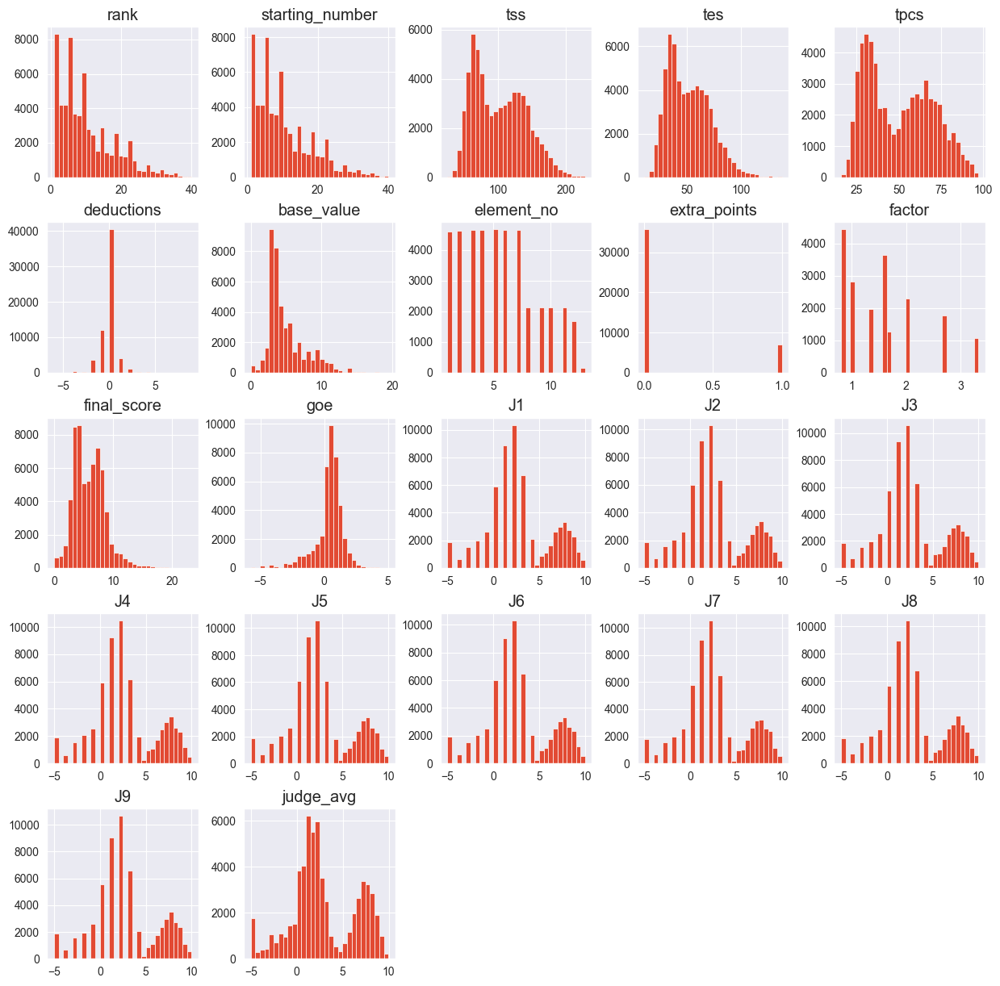

In [18]:
data_df[numeric_cols].hist(figsize=(15, 15), bins=30)
plt.show()

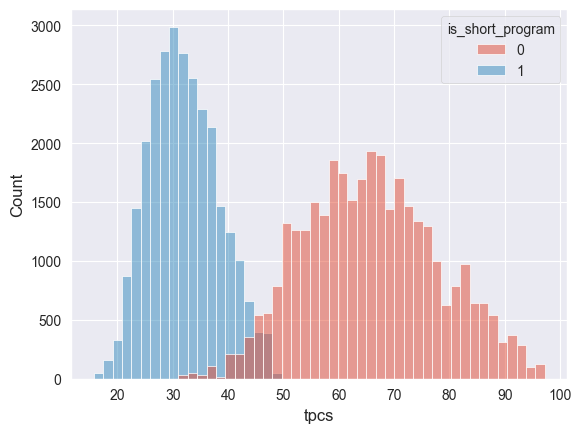

In [19]:
# why is tpcs bimodal
sns.histplot(
        data=data_df, 
        x="tpcs",
        hue="is_short_program",
    )
plt.show()

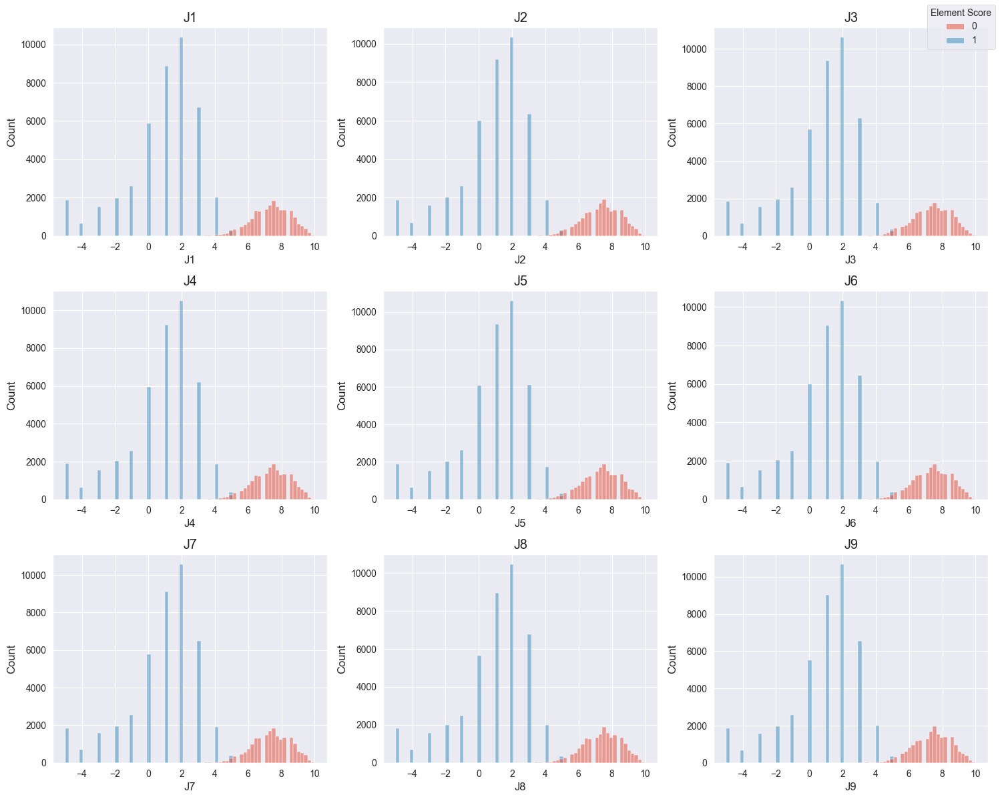

In [20]:
# why is judge col bimodal
n_cols = 3
n_plots = len(judge_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()

legend_data = None

for i, c in enumerate(judge_cols):
    sns.histplot(data=data_df, x=c, hue="is_element",bins =70, ax=axes[i])
    axes[i].set_title(c)
    
    # Capture the legend object from the first successful plot
    if legend_data is None and axes[i].get_legend():
        legend_obj = axes[i].get_legend()
        handles = legend_obj.legend_handles
        labels = [text.get_text() for text in legend_obj.get_texts()]
        legend_data = (handles, labels)
    
    # Remove individual legend
    if axes[i].get_legend():
        axes[i].get_legend().remove()

if legend_data:
    fig.legend(
        handles=legend_data[0],
        labels=legend_data[1],
        loc="upper right",
        title="Element Score"
    )

plt.tight_layout()
plt.show()


**Observations:**
- **Judge Scores** 
    - look relatively normal but bimodal suddenly
        - second hump is cause of element and program components; otherwise it all looks p normal
- **Extra Points**
    - most elements are not extra points
    - Question: How does # of extra point elements impact your score?
- **TSS/TES/TPCS**
    - Should remove one of these since they are clearly linear dependent (probably TSS)
    - ACTION: TES / TPCS feature? manually looking at score sheets, seems like people with high TES / TPCS tend to do better?
- **DEDUCTIONS**
    - Almost nobody gets a deduction
    - ACTION: Where in the program do deductions happen?
- **BASE VALUE**
    - Fat right tail
    - ACTION: Where are the high base value elements located in the program?
    - ACTION: How many high base value elements do people do?
    - ACTION: Base Value conditioned on rankings?
    - ACTION: Perhaps the people doing the super hard jumps are the people are way more talented. Does having a high base val mean that judges will score you higher on average?
        - ACTION: Maybe add total base val z-score feature? maybe ordinal ranking of total base val score?
- **GOE**
    - Thin tails, mostly clustered near 0
    - ACTION: How does GOE correlate with Base Value (presumably negative)?
    - ACTION: GOE conditioned on rankings?
- **FACTOR**
    - ACTION: idrk what this is yet 
    - DONE: seems like it is a thing to balance out the execution score and the performance component scores.
- **is_mens**
    - ACTION: Group by gender and see what patterns might appear; violin plot etc.
    - DONE: see below

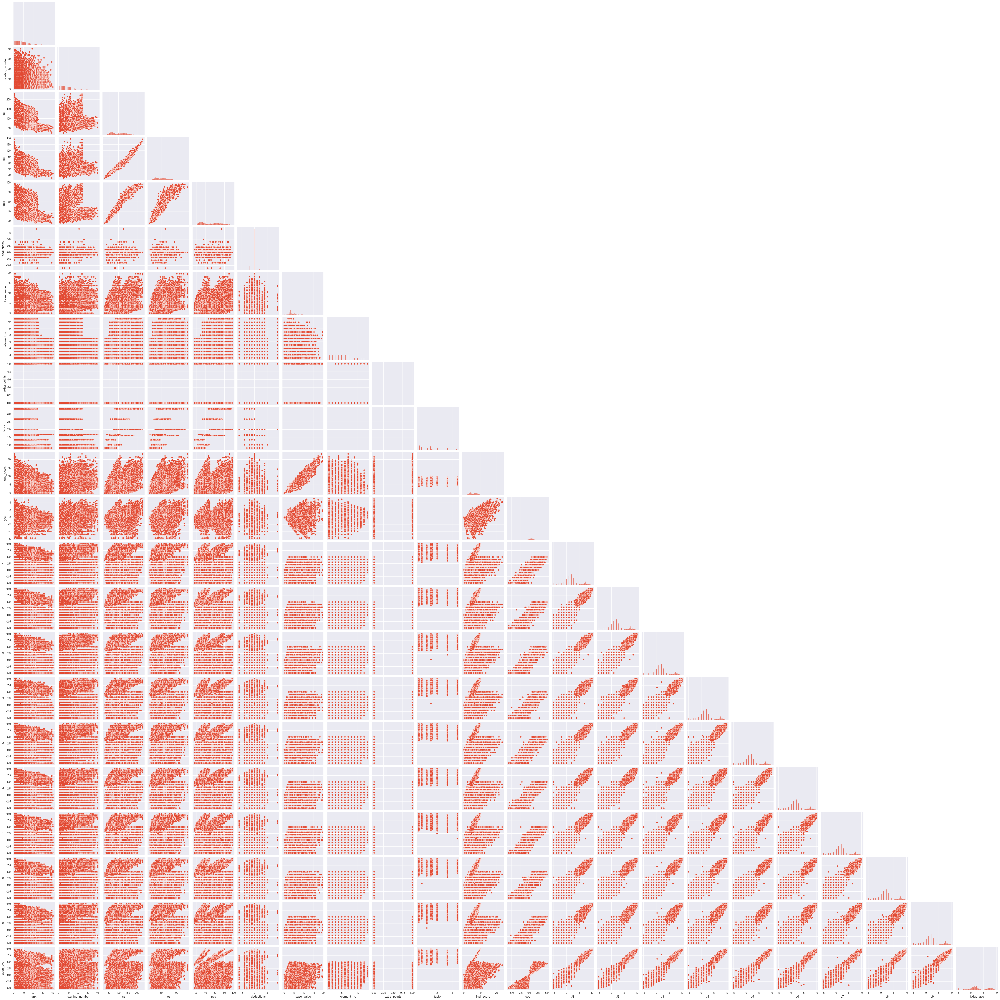

In [21]:
sns.pairplot(data_df[numeric_cols], corner=True)

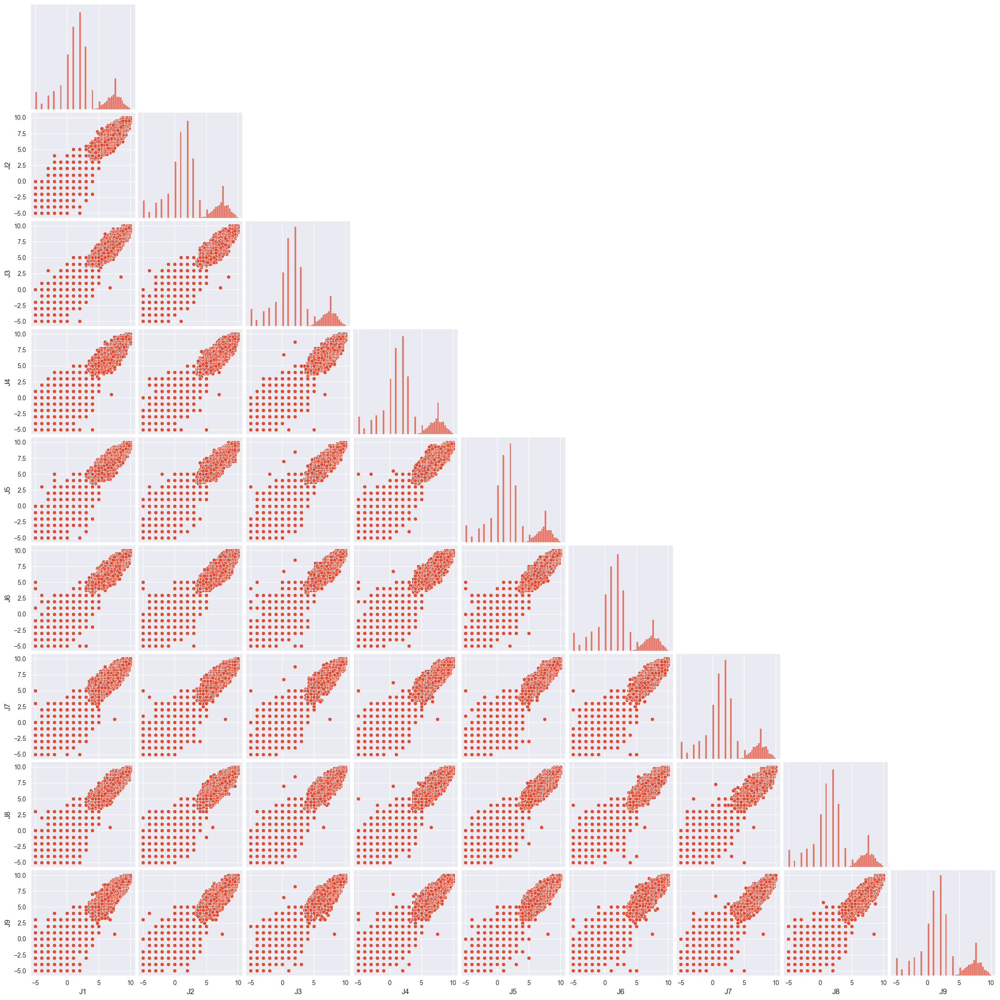

In [22]:
sns.pairplot(data_df[judge_cols], corner=True)
plt.show()

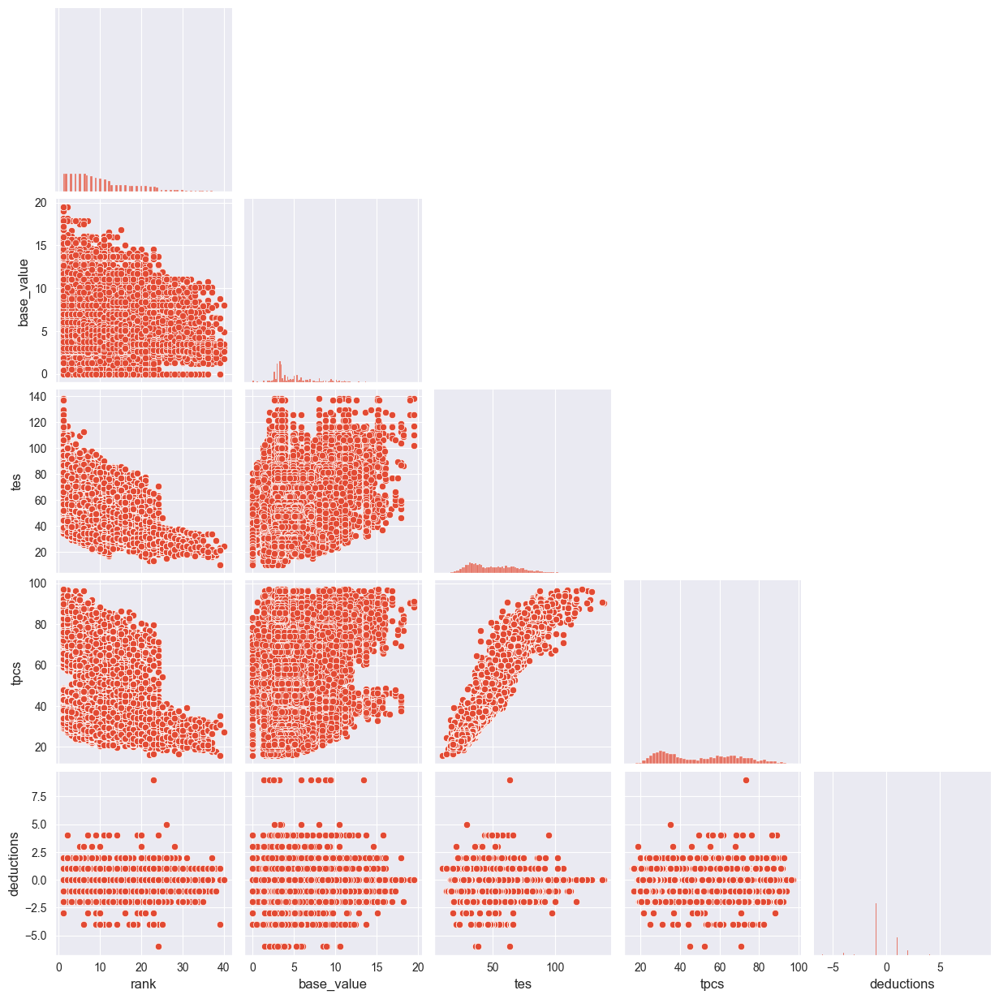

In [23]:
sns.pairplot(data_df[["rank", "base_value", "tes", "tpcs", "deductions"]], corner=True)
plt.show()

**Observations/Actions:**
- **Judge Scores**
    - Are the extra points are baked in already to the judge scores? (ACTION: violinplot comparing the distributions of is_extra)
    - Recalling the permutation trick, the fact that these all look the same makes more sense. They are all drawn from the same mixed distribution?
- **Base Val**
    - Band of base val when compared rank (everyone doing the basic stuff)
    - ACTION: new feature per person is like highest ranked base val component or something
- **TES**
    - Distinct Lines of TES/TPCS/TSS wrt rank
        - ACTION: my guess is that this is women vs men; off inspection top women scorers are scoring much less than top men scorers (DONE)

### Trying to See Nationality Bias

In [24]:
data_df.head()

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
3,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.5000,wc2018,3Li4,4.0000,0.0000,NaN,6.0000,1.5000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,2.0000,3.0000,3.0000,1,pairs,individual,2.8889,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
4,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,3.9000,wc2018,StSq4,5.0000,0.0000,NaN,6.0000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0


In [25]:
id_cols = [c for c in data_df.columns if not any(
    c.startswith(stub) for stub in ["J", "judge_same", "judge_nat"]
)]

long_data_df = (
    data_df
        .reset_index()
        .rename(columns={"index": "id"})
        .pipe(
            lambda x: pd.wide_to_long(
                x,
                stubnames=["J", "judge_same", "judge_nat"],
                i=["id"] + id_cols,
                j="num"
            )
        )
        .reset_index()
)

In [26]:
long_data_df.shape

(558441, 38)

In [27]:
data_df.shape

(62049, 60)

In [28]:
long_data_df.head()

,id,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,is_short_program,category,event_type,judge_avg,judge_name1,judge_name2,judge_name3,judge_name4,judge_name5,judge_name6,judge_name7,judge_name8,judge_name9,num,J,judge_same,judge_nat
0,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,morandi tiziana,howard karen,anthony leroy,glenn roger,andreas waldeck,binder elisabeth,jia yao,jelinek lisa,blanc christine,1,3.0000,0,ITA
1,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,morandi tiziana,howard karen,anthony leroy,glenn roger,andreas waldeck,binder elisabeth,jia yao,jelinek lisa,blanc christine,2,3.0000,0,CAN
2,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,morandi tiziana,howard karen,anthony leroy,glenn roger,andreas waldeck,binder elisabeth,jia yao,jelinek lisa,blanc christine,3,3.0000,0,FRA
3,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,morandi tiziana,howard karen,anthony leroy,glenn roger,andreas waldeck,binder elisabeth,jia yao,jelinek lisa,blanc christine,4,3.0000,0,USA
4,0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,1,pairs,individual,3.0000,morandi tiziana,howard karen,anthony leroy,glenn roger,andreas waldeck,binder elisabeth,jia yao,jelinek lisa,blanc christine,5,3.0000,1,GER


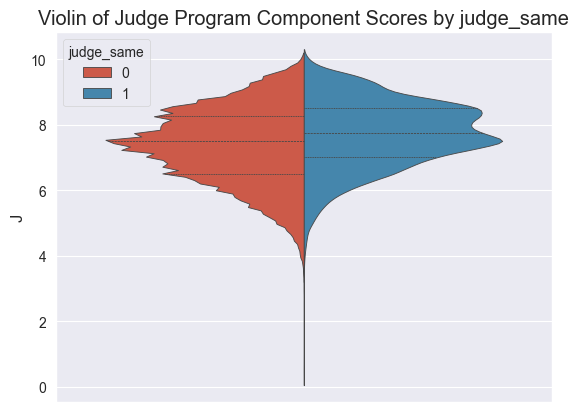

In [29]:
(
    sns.violinplot(
        y="J",
        hue="judge_same",
        data=long_data_df[lambda x:  x.is_element == 0],
        split=True,
        inner="quartile",
    )
    .set(title="Violin of Judge Program Component Scores by judge_same")
)
plt.show()

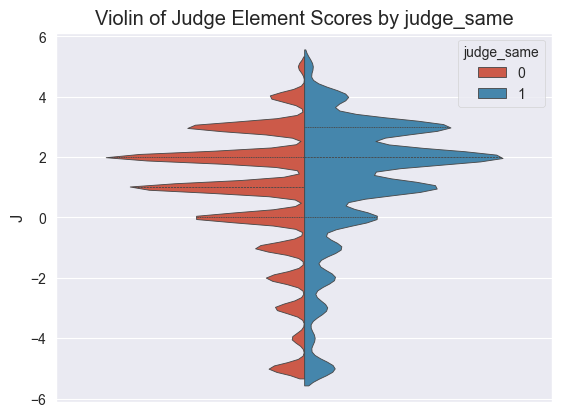

In [30]:
(
    sns.violinplot(
        y="J",
        hue="judge_same",
        data=long_data_df[lambda x:  x.is_element == 1],
        split=True,
        inner="quartile",
    )
    .set(title="Violin of Judge Element Scores by judge_same")
)
plt.show()

### Correlations across Elements and PCs

In [31]:
judge_cols

['J1', 'J2', 'J3', 'J4', 'J5', 'J6', 'J7', 'J8', 'J9']

In [32]:
# Melt (unpivot) the judge_cols so each judge is its own row, then group accordingly.
fs_elements_long = (
    data_df
        [lambda x: (x.is_element == 1) & (x.is_short_program == 0)]
        .set_index(["name", "competition", "category", "event_type"])
        [["element_no"] + judge_cols]
        .reset_index()
        .melt(
            id_vars=["name", "competition", "category", "event_type", "element_no"],
            value_vars=judge_cols,
            var_name="judge",
            value_name="score"
        )
)

# For convenient viewing, you can optionally pivot to element_no as columns, but keeping judges as a row variable:
fs_elements_corr_long = (
    fs_elements_long
        .pivot_table(
            index=["name", "competition", "category", "event_type", "judge"],
            columns="element_no",
            values="score"
        )
)

fs_elements_corr_long


element_no                                                             1.0000   \
name                            competition category event_type judge            
Abzal Rakimgaliev               fc2018      men      individual J1     -2.0000   
                                                                J2     -2.0000   
                                                                J3     -3.0000   
                                                                J4     -3.0000   
                                                                J5     -3.0000   
...                                                                        ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5      2.0000   
                                                                J6      2.0000   
                                                                J7      1.0000   
                                                                J8      2.0000   
                                                                J9      1.0000   

element_no                                                             2.0000   \
name                            competition category event_type judge            
Abzal Rakimgaliev               fc2018      men      individual J1     -2.0000   
                                                                J2     -2.0000   
                                                                J3     -2.0000   
                                                                J4     -2.0000   
                                                                J5     -2.0000   
...                                                                        ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5     -2.0000   
                                                                J6      0.0000   
                                                                J7      0.0000   
                                                                J8     -1.0000   
                                                                J9      1.0000   

element_no                                                             3.0000   \
name                            competition category event_type judge            
Abzal Rakimgaliev               fc2018      men      individual J1      1.0000   
                                                                J2      1.0000   
                                                                J3      0.0000   
                                                                J4      0.0000   
                                                                J5      0.0000   
...                                                                        ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5      2.0000   
                                                                J6      1.0000   
                                                                J7      0.0000   
                                                                J8      2.0000   
                                                                J9      1.0000   

element_no                                                             4.0000   \
name                            competition category event_type judge            
Abzal Rakimgaliev               fc2018      men      individual J1      2.0000   
                                                                J2      2.0000   
                                                                J3      0.0000   
                                                                J4      1.0000   
                                                                J5      0.0000   
...                                                                        ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5      2.0000   
                                                             

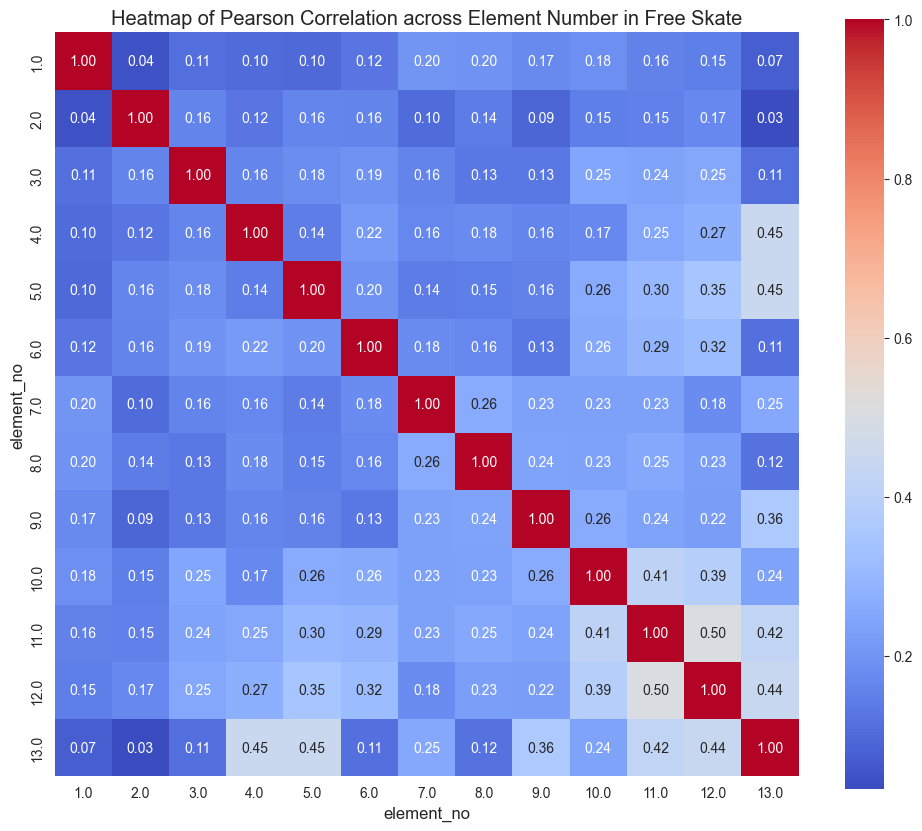

In [33]:
plt.figure(figsize=(12, 10))
sns.heatmap(fs_elements_corr_long.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Heatmap of Pearson Correlation across Element Number in Free Skate")
plt.show()

In [34]:
# fs_elements_corr = (
#     data_df
#         [lambda x: (x.is_element == 1) & (x.is_short_program == 0)]
#         .set_index(["name", "competition", "category", "event_type"])
#         [["element_no", "judge_avg"] + judge_cols]
#         .drop(columns=judge_cols)
#         .reset_index()
#         .pivot(
#             index=["name", "competition",  "category", "event_type"],
#             columns="element_no",
#             values="judge_avg"
#         )
# )

# plt.figure(figsize=(12, 10))
# sns.heatmap(fs_elements_corr.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
# plt.title("Heatmap of Pearson Correlation across Element Number in Free Skate")
# plt.show()

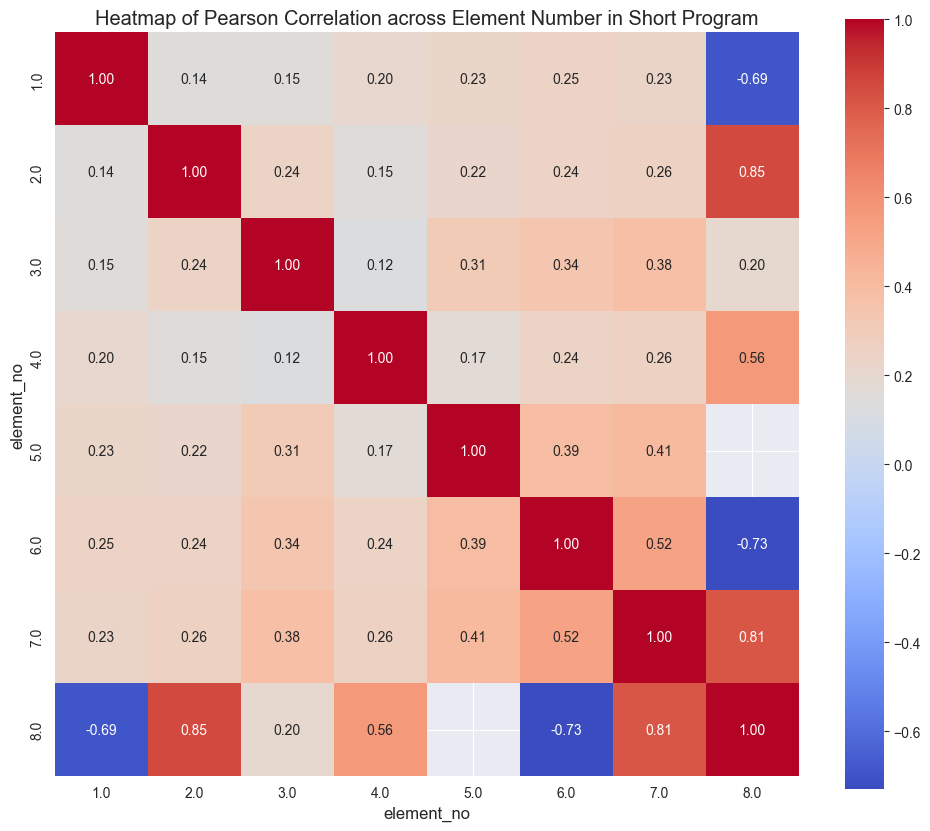

In [35]:
# Melt (unpivot) the judge_cols so each judge is its own row, then group accordingly.
short_elements_long = (
    data_df
        [lambda x: (x.is_element == 1) & (x.is_short_program == 1)]
        .set_index(["name", "competition", "category", "event_type"])
        [["element_no"] + judge_cols]
        .reset_index()
        .melt(
            id_vars=["name", "competition", "category", "event_type", "element_no"],
            value_vars=judge_cols,
            var_name="judge",
            value_name="score"
        )
)

# For convenient viewing, you can optionally pivot to element_no as columns, but keeping judges as a row variable:
short_element_corr_long = (
    short_elements_long
        .pivot_table(
            index=["name", "competition", "category", "event_type", "judge"],
            columns="element_no",
            values="score"
        )
)

plt.figure(figsize=(12, 10))
sns.heatmap(short_element_corr_long.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Heatmap of Pearson Correlation across Element Number in Short Program")
plt.show()


In [36]:
# short_element_corr = (
#     data_df
#         [lambda x: (x.is_element == 1) & (x.is_short_program == 1)]
#         .set_index(["name", "competition", "category", "event_type"])
#         [["element_no", "judge_avg"] + judge_cols]
#         .drop(columns=judge_cols)
#         .reset_index()
#         .pivot(
#             index=["name", "competition",  "category", "event_type"],
#             columns="element_no",
#             values="judge_avg"
#         )
# )

# plt.figure(figsize=(12, 10))
# sns.heatmap(short_element_corr.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
# plt.title("Heatmap of Pearson Correlation across Element Number in Short Program")
# plt.show()

In [37]:
short_element_corr_long[lambda x: ~x[8.0].isna()]

element_no                                            1.0000  2.0000  3.0000  \
name           competition category event_type judge                           
Kevin Reynolds gpusa2017   men      individual J1    -2.0000 -1.0000  0.0000   
                                               J2    -1.0000  0.0000  0.0000   
                                               J3    -1.0000  0.0000  0.0000   
                                               J4    -1.0000  1.0000  0.0000   
                                               J5    -2.0000  0.0000  0.0000   
                                               J6    -2.0000  1.0000  0.0000   
                                               J7    -2.0000  1.0000  0.0000   
                                               J8    -3.0000  1.0000  0.0000   
                                               J9     0.0000  1.0000  0.0000   
Mark Webster   fc2018      men      individual J1    -1.0000 -3.0000  0.0000   
                                               J2    -1.0000 -3.0000 -1.0000   
                                               J3    -1.0000 -3.0000 -1.0000   
                                               J4    -1.0000 -3.0000  0.0000   
                                               J5     0.0000 -3.0000  0.0000   
                                               J6     0.0000 -3.0000 -1.0000   
                                               J7    -1.0000 -3.0000  0.0000   
                                               J8     0.0000 -3.0000  1.0000   
                                               J9    -1.0000 -3.0000  0.0000   

element_no                                            4.0000  5.0000  6.0000  \
name           competition category event_type judge                           
Kevin Reynolds gpusa2017   men      individual J1     0.0000     NaN  1.0000   
                                               J2     0.0000     NaN  0.0000   
                                               J3     1.0000     NaN -1.0000   
                                               J4     2.0000     NaN  0.0000   
                                               J5     1.0000     NaN -1.0000   
                                               J6     0.0000     NaN -2.0000   
                                               J7     1.0000     NaN  0.0000   
                                               J8     1.0000     NaN -2.0000   
                                               J9     1.0000     NaN -2.0000   
Mark Webster   fc2018      men      individual J1     0.0000 -1.0000  0.0000   
                                               J2     0.0000 -2.0000  0.0000   
                                               J3     0.0000  0.0000  0.0000   
                                               J4     0.0000 -1.0000  1.0000   
                                               J5     0.0000 -1.0000  0.0000   
                                               J6     0.0000 -1.0000  1.0000   
                                               J7     0.0000 -1.0000  0.0000   
                                               J8     0.0000  1.0000  1.0000   
                                               J9     0.0000 -1.0000  0.0000   

element_no                                            7.0000  8.0000  
name           competition category event_type judge                  
Kevin Reynolds gpusa2017   men      individual J1     1.0000  1.0000  
                                               J2     0.0000  0.0000  
                                               J3     1.0000  1.0000  
                                               J4     1.0000  1.0000  
                                               J5     1.0000  1.0000  
                                               J6     1.0000  2.0000  
                                               J7     1.0000  1.0000  
                                               J8     1.0000  2.0000  
                                               J9     1.0000  1.0000  
Mark Webster   fc

In [38]:
data_df[lambda x: (x.element_no == 8) & (x.is_short_program == 1)]

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
37871,28,Mark Webster,AUS,14,49.4500,21.3800,29.0700,1.0000,0.0000,fc2018,3F*+2T*,8.0000,0.0000,NaN,0.0000,0.0000,*,1,NaN,1718,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1,men,individual,0.0000,keen leslie,CAN,graham peggy,USA,angelique clyde-smith,AUS,kubota masako,JPN,chen weiguang,CHN,ahn na young,KOR,magdalena rusiecka,POL,guskov yuri,KAZ,numanova saodat,UZB,0,0,1,0,0,0,0,0,0
51363,10,Kevin Reynolds,CAN,5,69.1000,32.7500,36.3500,0.0000,3.5000,gpusa2017,CCoSp4,8.0000,0.0000,NaN,4.0700,0.5700,NaN,1,NaN,1718,1.0000,0.0000,1.0000,1.0000,1.0000,2.0000,1.0000,2.0000,1.0000,1,men,individual,1.1111,alexei beletski,ISR,an so young,KOR,chen weiguang,CHN,elke treitz,GER,kuno yoko,JPN,martinez sasha,MEX,babenko sviatoslav,RUS,enzmann wendy,USA,abbott jodi,CAN,0,0,0,0,0,0,0,0,1


Mark Webster had 8 cause he repeated a jump I think

In [39]:
# pc_corr = (
#     data_df
#         [lambda x: (x.is_element == 0)]
#         .set_index(["name", "competition","is_short_program", "category", "event_type"])
#         [["program_component", "judge_avg"] + judge_cols]
#         .drop(columns=judge_cols)
#         .reset_index()
#         .pivot(
#             index=["name", "competition", "is_short_program", "category", "event_type"],
#             columns="program_component",
#             values="judge_avg"
#         )
#         # .corr()
# )
# sns.pairplot(pc_corr)

In [40]:
# pc_corr

In [41]:
# plt.figure(figsize=(12, 10))
# sns.heatmap(pc_corr.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
# plt.title("Heatmap of Pearson Correlation across PC in Same Skating Round")
# plt.show()

In [42]:
# c1 = "Skating Skills"
# c2 = "Interpretation of the Music"
# (
#     data_df
#         [
#             lambda x: (x.is_element == 0) 
#                     & (
#                         (x.program_component == c1) 
#                         | (x.program_component == c2)
#                       )
#         ]
#         [["name", "competition","is_short_program", "category", "event_type", "program_component", "J1"]]
#         .pivot(
#             index=["name", "competition", "is_short_program", "category", "event_type"],
#             columns="program_component",
#             values="J1"
#         )
#         .plot.scatter(x=c1, y=c2)
# )


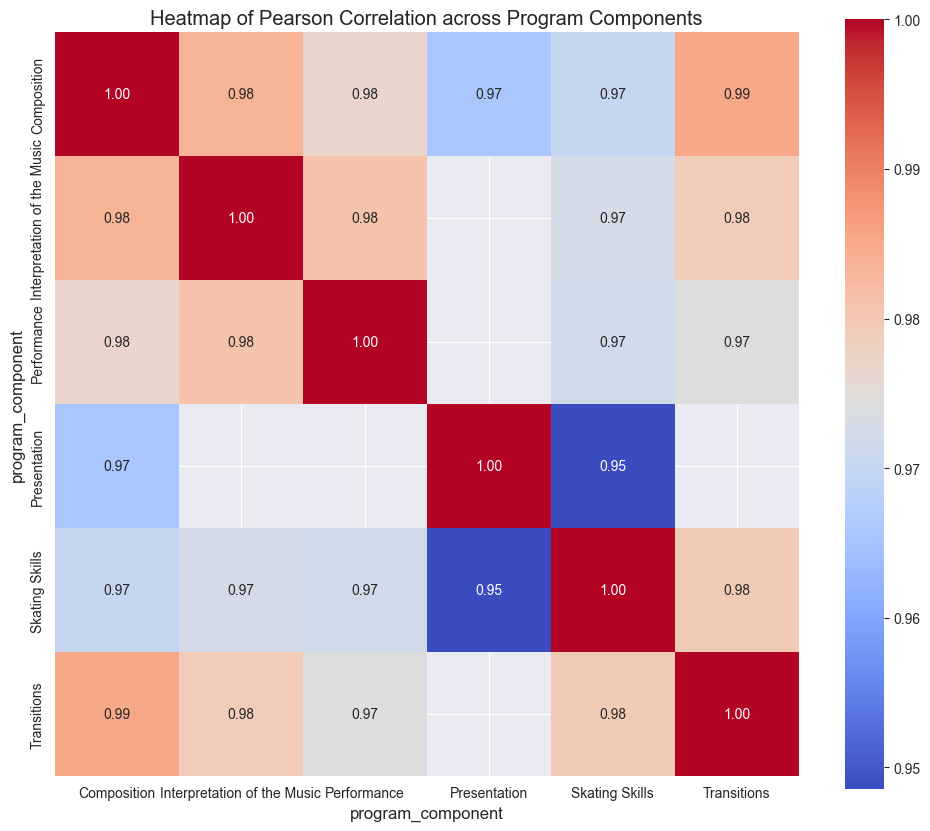

In [43]:
# Melt (unpivot) the judge_cols so each judge is its own row, then group accordingly.
pc_long = (
    data_df
        [lambda x: (x.is_element == 0)]
        .set_index(["name", "competition", "category", "event_type"])
        [["program_component"] + judge_cols]
        .reset_index()
        .melt(
            id_vars=["name", "competition", "category", "event_type", "program_component"],
            value_vars=judge_cols,
            var_name="judge",
            value_name="score"
        )
)


# For convenient viewing, you can optionally pivot to element_no as columns, but keeping judges as a row variable:
pc_corr_long = (
    pc_long
        .pivot_table(
            index=["name", "competition", "category", "event_type", "judge"],
            columns="program_component",
            values="score"
        )
)

plt.figure(figsize=(12, 10))
sns.heatmap(pc_corr_long.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Heatmap of Pearson Correlation across Program Components")
plt.show()


#### Subtracting out Judge Avg

In [44]:
data_df = (
    data_df
        .assign(
            judge_avg = lambda x: x[[f"J{i}" for i in range(1,10)]].mean(axis=1)
        )
)
test = data_df.copy()
judge_cols = [f"J{i}" for i in range(1, 10)]

# Row-wise mean across judges
test = data_df.assign(
    judge_avg=lambda x: x[judge_cols].mean(axis=1)
)

# Judge-level residuals: score minus the row mean
for j in judge_cols:
    test[f"{j}_centered"] = test[j] - test["judge_avg"]

centered_cols = [f"{j}_centered" for j in judge_cols]

In [45]:
# Melt (unpivot) the judge_cols so each judge is its own row, then group accordingly.
fs_elements_long = (
    test
        [lambda x: (x.is_element == 1) & (x.is_short_program == 0)]
        .set_index(["name", "competition", "category", "event_type"])
        [["element_no"] + centered_cols]
        .reset_index()
        .melt(
            id_vars=["name", "competition", "category", "event_type", "element_no"],
            value_vars=centered_cols,
            var_name="judge",
            value_name="score"
        )
)

# For convenient viewing, you can optionally pivot to element_no as columns, but keeping judges as a row variable:
fs_elements_corr_long = (
    fs_elements_long
        .pivot_table(
            index=["name", "competition", "category", "event_type", "judge"],
            columns="element_no",
            values="score"
        )
)

fs_elements_corr_long


element_no                                                                   1.0000   \
name                            competition category event_type judge                  
Abzal Rakimgaliev               fc2018      men      individual J1_centered   0.4444   
                                                                J2_centered   0.4444   
                                                                J3_centered  -0.5556   
                                                                J4_centered  -0.5556   
                                                                J5_centered  -0.5556   
...                                                                              ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5_centered   0.4444   
                                                                J6_centered   0.4444   
                                                                J7_centered  -0.5556   
                                                                J8_centered   0.4444   
                                                                J9_centered  -0.5556   

element_no                                                                   2.0000   \
name                            competition category event_type judge                  
Abzal Rakimgaliev               fc2018      men      individual J1_centered   0.0000   
                                                                J2_centered   0.0000   
                                                                J3_centered   0.0000   
                                                                J4_centered   0.0000   
                                                                J5_centered   0.0000   
...                                                                              ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5_centered  -1.4444   
                                                                J6_centered   0.5556   
                                                                J7_centered   0.5556   
                                                                J8_centered  -0.4444   
                                                                J9_centered   1.5556   

element_no                                                                   3.0000   \
name                            competition category event_type judge                  
Abzal Rakimgaliev               fc2018      men      individual J1_centered   0.3333   
                                                                J2_centered   0.3333   
                                                                J3_centered  -0.6667   
                                                                J4_centered  -0.6667   
                                                                J5_centered  -0.6667   
...                                                                              ...   
Zoe Jones / Christopher Boyadji wc2022      pairs    individual J5_centered   0.8889   
                                                                J6_centered  -0.1111   
                                                                J7_centered  -1.1111   
                                                                J8_centered   0.8889   
                                                                J9_centered  -0.1111   

element_no                                                                   4.0000   \
name                            competition category event_type judge                  
Abzal Rakimgaliev               fc2018      men      individual J1_centered   1.0000   
                                                                J2_centered   1.0000   
                                                                J3_centered  -1.0000   
                                                                J4_centered   0.0000   
                                     

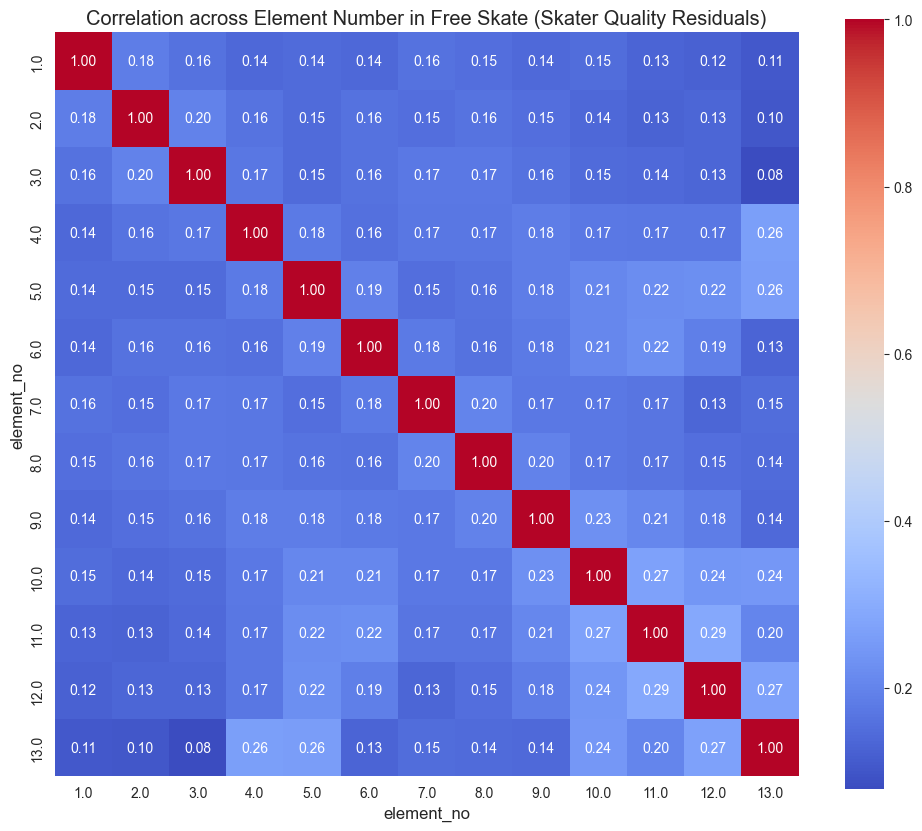

In [127]:
plt.figure(figsize=(12, 10))
sns.heatmap(fs_elements_corr_long.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation across Element Number in Free Skate (Skater Quality Residuals)")
plt.show()

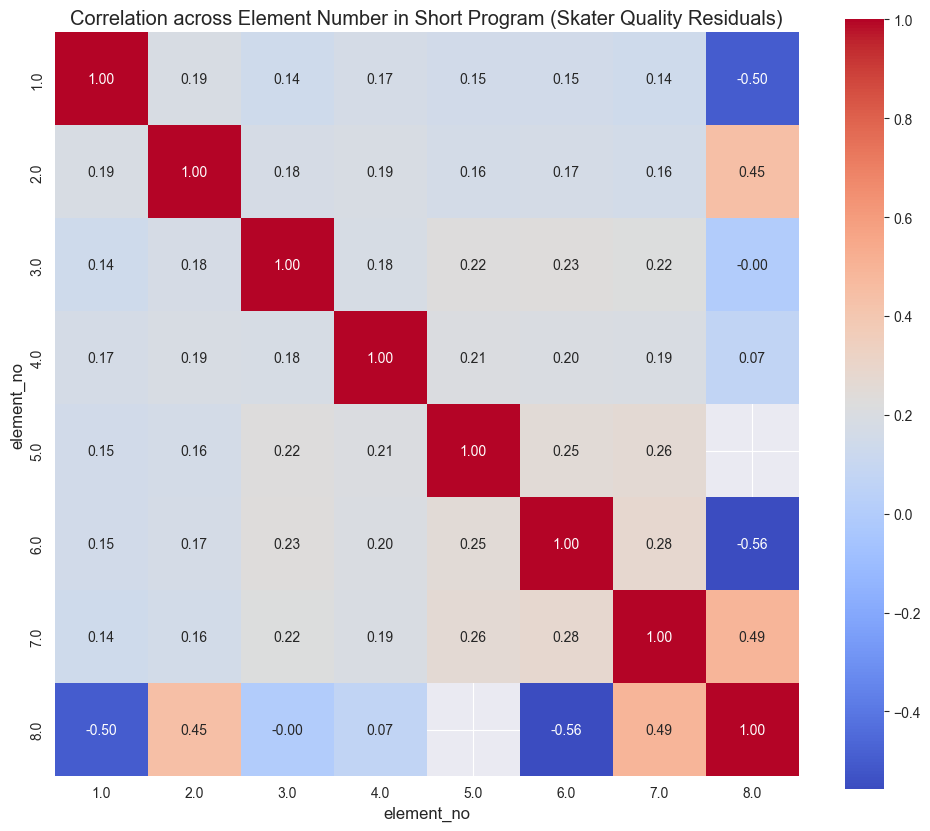

In [125]:
# Melt (unpivot) the judge_cols so each judge is its own row, then group accordingly.
short_elements_long = (
    test
        [lambda x: (x.is_element == 1) & (x.is_short_program == 1)]
        .set_index(["name", "competition", "category", "event_type"])
        [["element_no"] + centered_cols]
        .reset_index()
        .melt(
            id_vars=["name", "competition", "category", "event_type", "element_no"],
            value_vars=centered_cols,
            var_name="judge",
            value_name="score"
        )
)

# For convenient viewing, you can optionally pivot to element_no as columns, but keeping judges as a row variable:
short_element_corr_long = (
    short_elements_long
        .pivot_table(
            index=["name", "competition", "category", "event_type", "judge"],
            columns="element_no",
            values="score"
        )
)

plt.figure(figsize=(12, 10))
sns.heatmap(short_element_corr_long.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation across Element Number in Short Program (Skater Quality Residuals)")
plt.show()


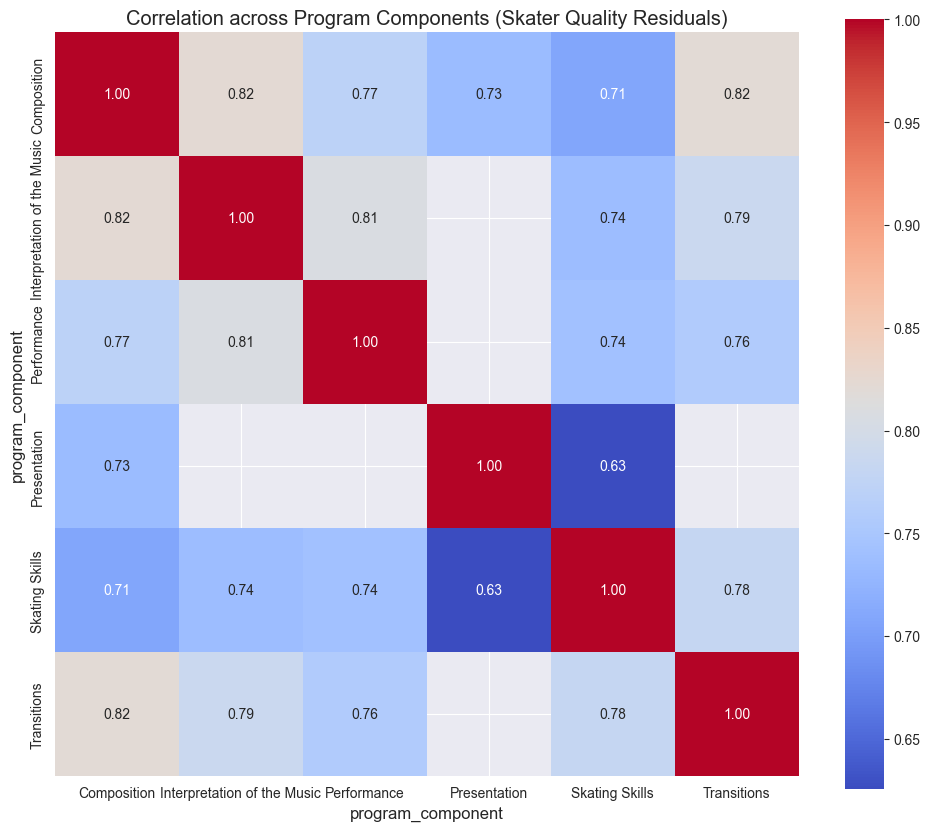

In [126]:
# Melt (unpivot) the judge_cols so each judge is its own row, then group accordingly.
pc_long = (
    test
        [lambda x: (x.is_element == 0)]
        .set_index(["name", "competition", "category", "event_type"])
        [["program_component"] + centered_cols]
        .reset_index()
        .melt(
            id_vars=["name", "competition", "category", "event_type", "program_component"],
            value_vars=centered_cols,
            var_name="judge",
            value_name="score"
        )
)

# For convenient viewing, you can optionally pivot to element_no as columns, but keeping judges as a row variable:
pc_corr_long = (
    pc_long
        .pivot_table(
            index=["name", "competition", "category", "event_type", "judge"],
            columns="program_component",
            values="score"
        )
)

plt.figure(figsize=(12, 10))
sns.heatmap(pc_corr_long.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation across Program Components (Skater Quality Residuals)")
plt.show()


### Base Val

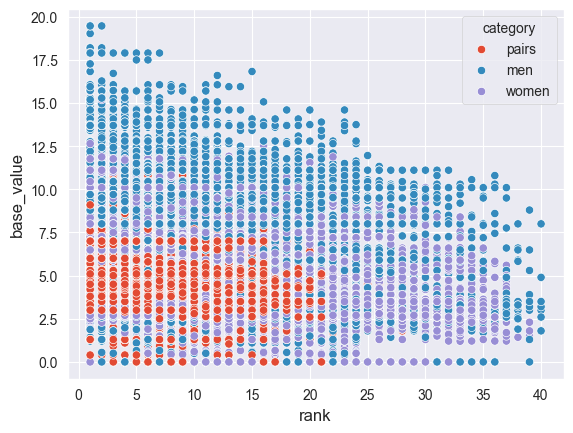

In [49]:
sns.scatterplot(data=data_df, x="rank", y="base_value", hue="category")
plt.show()

### TES

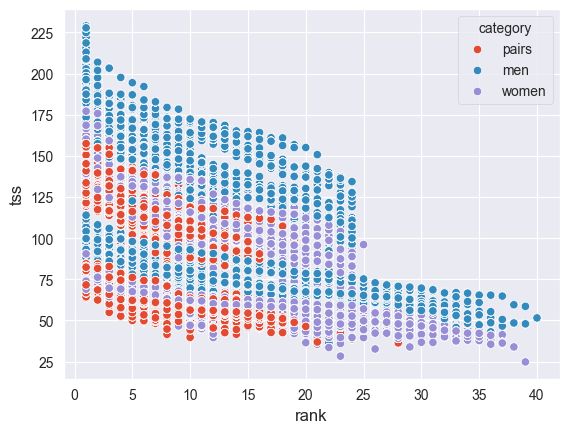

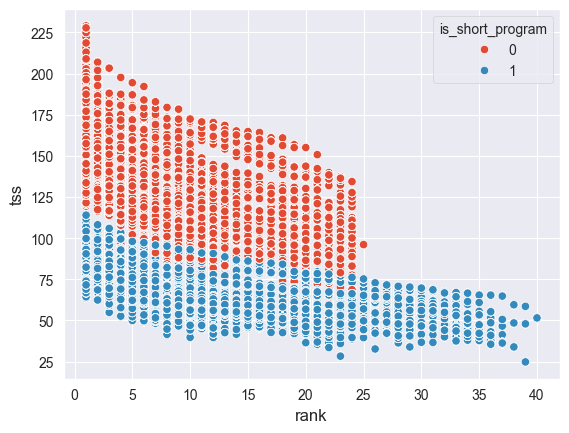

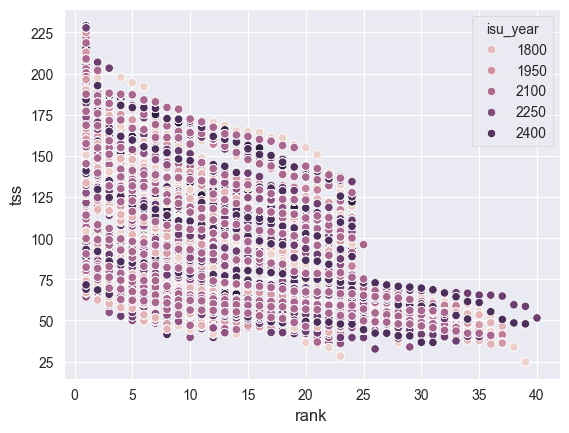

In [50]:
# in tss vs rank plot, the lines are distinct
sns.scatterplot(data=data_df, x="rank", y="tss", hue="category")
plt.show()

# distinct lines are due to gender and due to free vs short program
sns.scatterplot(data=data_df, x="rank", y="tss", hue="is_short_program")
plt.show()

sns.scatterplot(data=data_df, x="rank", y="tss", hue="isu_year")
plt.show()

Intuitively this should make sense that the free skate is much higher is score; it literally is longer.

### Gender Split

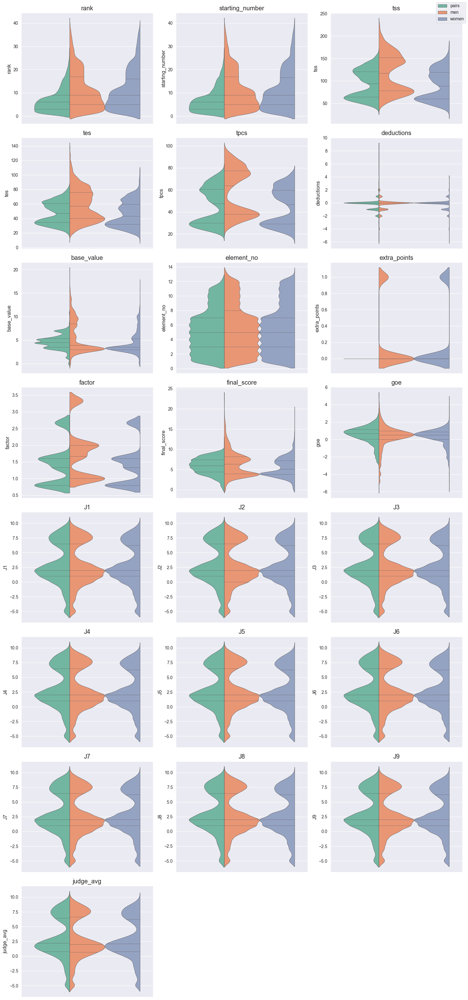

In [51]:
n_cols = 3
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # make indexing easy

for i, c in enumerate(numeric_cols):
    sns.violinplot(
        y=c,
        hue="category",
        data=data_df,
        split=True,
        inner="quartile",
        palette="Set2",
        ax=axes[i]
    )
    axes[i].set_title(c)
    axes[i].legend_.remove()  # remove repeated legends

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")

plt.tight_layout()
plt.show()


### Short Program Split

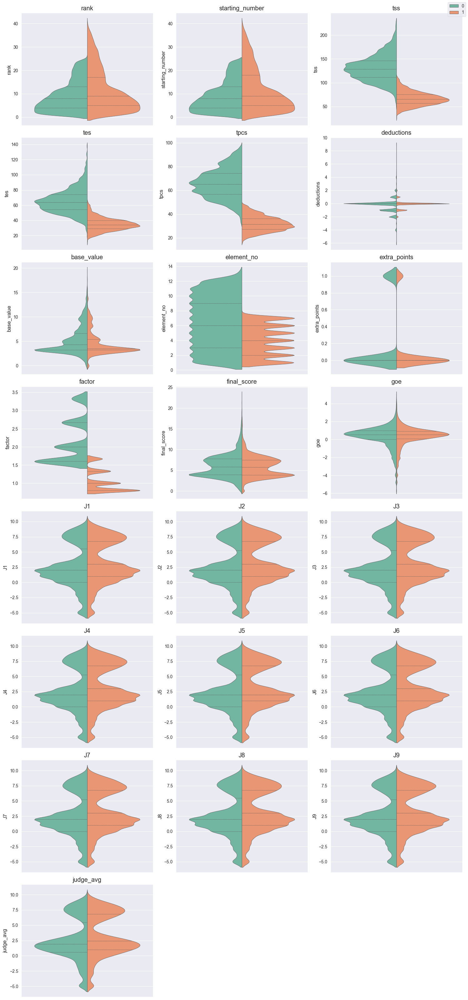

In [52]:
n_cols = 3
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # make indexing easy

for i, c in enumerate(numeric_cols):
    sns.violinplot(
        y=c,
        hue="is_short_program",
        data=data_df,
        split=True,
        inner="quartile",
        palette="Set2",
        ax=axes[i]
    )
    axes[i].set_title(c)
    axes[i].legend_.remove()  # remove repeated legends

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")

plt.tight_layout()
plt.show()


### Extra Points Split

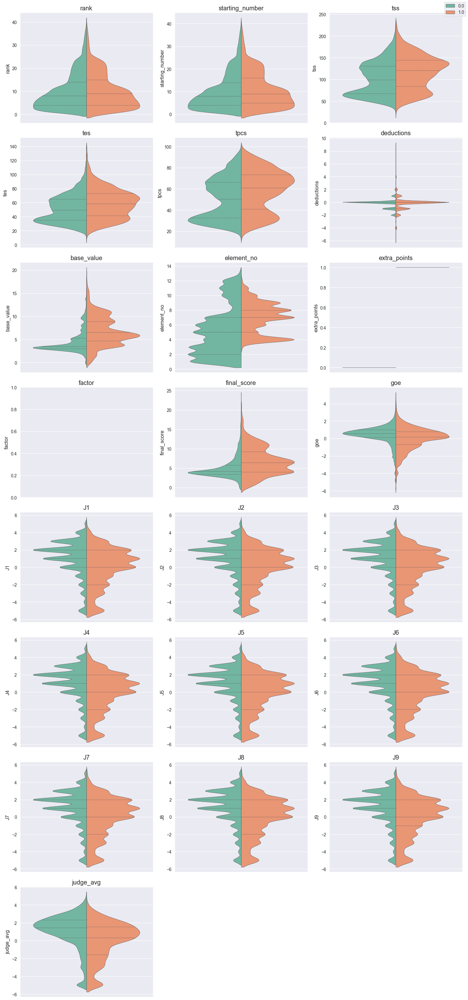

In [53]:
n_cols = 3
n_plots = len(numeric_cols)
n_rows = math.ceil(n_plots / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axes = axes.flatten()  # make indexing easy

for i, c in enumerate(numeric_cols):
    sns.violinplot(
        y=c,
        hue="extra_points",
        data=data_df,
        split=True,
        inner="quartile",
        palette="Set2",
        ax=axes[i]
    )
    axes[i].set_title(c)
    axes[i].legend_.remove()  # remove repeated legends

# Remove unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Add one shared legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right")

plt.tight_layout()
plt.show()


### Final Score

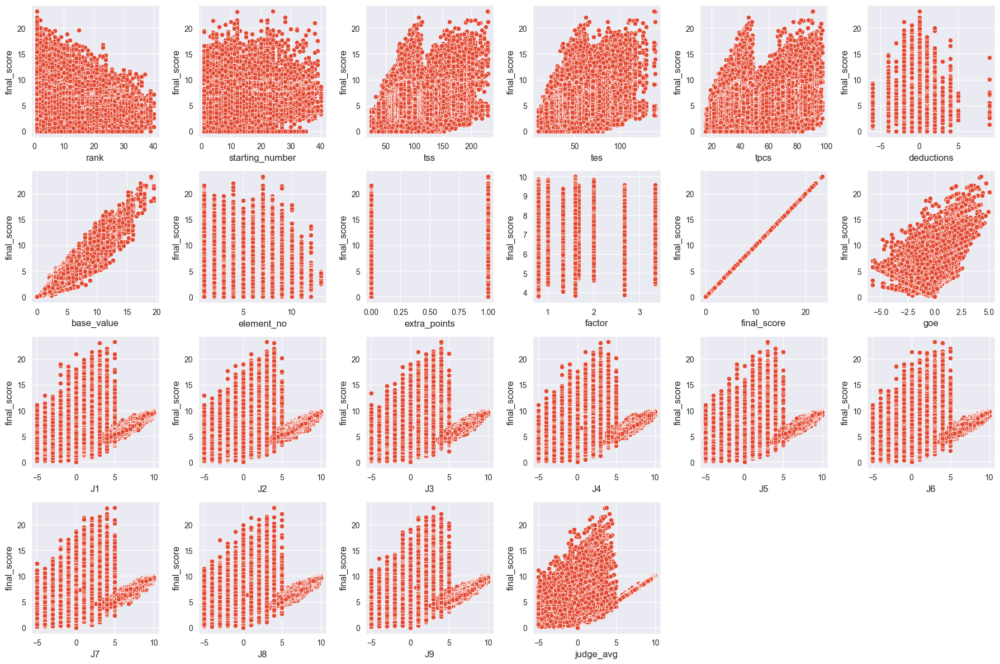

In [54]:
pairplot_list_against_list(data_df, numeric_cols, ["final_score"])

## Categorical Variables

### Number of Datapoints per Judge

In [55]:
judge_count_df = (
    data_df
        .groupby(["name", "competition", "is_short_program", "category", "event_type"])
        .agg({f"judge_name{i}" : "first" for i in range(1,10)})
        .reset_index()
        .pipe(
            lambda x: pd.melt(
                x,
                id_vars=["name", "competition", "is_short_program", "category", "event_type"],
                value_vars=[f"judge_name{i}" for i in range(1, 10)],
                var_name="judge_num",
                value_name="judge_name"
            )
        )
)
judge_count_df.head()

,name,competition,is_short_program,category,event_type,judge_num,judge_name
0,Abzal Rakimgaliev,fc2018,0,men,individual,judge_name1,guskov yuri
1,Abzal Rakimgaliev,fc2018,1,men,individual,judge_name1,keen leslie
2,Abzal Rakimgaliev,wc2018,1,men,individual,judge_name1,anna sierocka
3,Adam Hagara,ec2022,1,men,individual,judge_name1,popova vessela
4,Adam Hagara,ec2023,0,men,individual,judge_name1,stahl ursula


In [56]:
judge_count_df["judge_name"].value_counts()

judge_name
abele agita                            765
anna kantor                            686
chigogidze salome                      565
de francoise rappard                   519
anthony leroy                          500
kadi zvirik                            468
jung lee sue                           464
nadezhda paretskaia                    451
kulik zanna                            445
kozhemyakina olga                      439
kliushnikov yury                       430
marta olozagarre                       424
florence vuylsteker                    402
horiuchi ritsuko                       371
numanova saodat                        363
vikarne-homolya zsuzsanna              361
kevin rosenstein                       354
howard karen                           352
daniel delfa                           349
nobuhiko yoshioka                      343
an so young                            340
martinez sasha                         338
elena fomina                           332


In [57]:
judge_count_df["judge_name"].value_counts().shape

(312,)

In [58]:
final_judge_study_names_df = judge_count_df["judge_name"].value_counts().reset_index()[lambda x: x["count"] >= 30]

In [59]:
final_judge_study_names_df.shape

(289, 2)

# Interesting Questions

1. Controlling for skill or something like that, is it +ev to do lots of extra jumps and have your hardest jumps be extra points?
2. Do judges grade skilled skaters more favorablely?
3. Do judges grade "easy" elements all the same and then "hard" elements are the differentiating factor? (smth smth variance of so-called easy jumps vs variance of so-called hard jumps?)
4. Reproducing similar study questions like which judges are being dropped, trying to identify judges across the permutations

# Modeling

In [60]:
data_df.head(3)

,rank,name,noc,starting_number,tss,tes,tpcs,deductions,base_value,competition,element,element_no,extra_points,factor,final_score,goe,info,is_element,program_component,isu_year,J1,J2,J3,J4,J5,J6,J7,J8,J9,is_short_program,category,event_type,judge_avg,judge_name1,judge_nat1,judge_name2,judge_nat2,judge_name3,judge_nat3,judge_name4,judge_nat4,judge_name5,judge_nat5,judge_name6,judge_nat6,judge_name7,judge_nat7,judge_name8,judge_nat8,judge_name9,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9
0,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,6.6000,wc2018,3Tw4,1.0000,0.0000,NaN,8.7000,2.1000,NaN,1,NaN,1718,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,3.0000,1,pairs,individual,3.0000,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
1,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,4.4000,wc2018,3S,2.0000,0.0000,NaN,5.9000,1.5000,NaN,1,NaN,1718,2.0000,2.0000,3.0000,2.0000,3.0000,1.0000,1.0000,3.0000,2.0000,1,pairs,individual,2.1111,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0
2,1,Aljona Savchenko / Bruno Massot,GER,26,82.9800,44.1400,38.8400,0.0000,5.5000,wc2018,3FTh,3.0000,0.0000,NaN,6.4000,0.9000,NaN,1,NaN,1718,2.0000,0.0000,1.0000,2.0000,3.0000,1.0000,0.0000,2.0000,1.0000,1,pairs,individual,1.3333,morandi tiziana,ITA,howard karen,CAN,anthony leroy,FRA,glenn roger,USA,andreas waldeck,GER,binder elisabeth,AUT,jia yao,CHN,jelinek lisa,AUS,blanc christine,SUI,0,0,0,0,1,0,0,0,0


**Observation/Action**
- The errors on ees and pcs are correlated within a performance obviously, and also probably between short and free program for same skater.
- To avoid doing some clustered errors or smth like that, we are going to create an estimate for the overall TSS that a judge's scoring implies.
    - The estimate is constructed as follows: 
        - sum(base_val) + sum_(factor * judge_score)
    - For ee's, set factor to be 1 so that the above sum equals:
        - sum(base val) + sum(ee) + sum(factor * pc)

### Constructing mock "TSS" Score

In [61]:
agg_df = (
    data_df
        .groupby(["name", "noc", "isu_year", "competition", "is_short_program", "category", "event_type", "is_element"])
        .agg(
            {f"J{i}" : "sum" for i in range(1,10)} |
            {f"judge_name{i}" : "first" for i in range(1,10)} |
            {f"judge_nat{i}" : "first" for i in range(1,10)} |
            {f"judge_same{i}" : "first" for i in range(1,10)} | 
            {
                "base_value" : "sum",
                "factor" : "first"
            }
        )
        .fillna(
            {
                "factor" : 1,
                "base_value" : 0
            }
        )
        .reset_index()       
)

for i in range(1, 10):
    agg_df[f"J_final{i}"] = (agg_df[f"J{i}"]* agg_df["factor"] + agg_df["base_value"]) 


In [62]:
agg_df.head()

,name,noc,isu_year,competition,is_short_program,category,event_type,is_element,J1,J2,J3,J4,J5,J6,J7,J8,J9,judge_name1,judge_name2,judge_name3,judge_name4,judge_name5,judge_name6,judge_name7,judge_name8,judge_name9,judge_nat1,judge_nat2,judge_nat3,judge_nat4,judge_nat5,judge_nat6,judge_nat7,judge_nat8,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9,base_value,factor,J_final1,J_final2,J_final3,J_final4,J_final5,J_final6,J_final7,J_final8,J_final9
0,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,0,31.7500,27.7500,27.2500,28.7500,26.5000,27.7500,29.5000,25.2500,29.5000,guskov yuri,ahn na young,angelique clyde-smith,magdalena rusiecka,kubota masako,keen leslie,numanova saodat,graham peggy,chen weiguang,KAZ,KOR,AUS,POL,JPN,CAN,UZB,USA,CHN,1,0,0,0,0,0,0,0,0,0.0000,2.0000,63.5000,55.5000,54.5000,57.5000,53.0000,55.5000,59.0000,50.5000,59.0000
1,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,1,-2.0000,-5.0000,-12.0000,-13.0000,-15.0000,-13.0000,-9.0000,-10.0000,-11.0000,guskov yuri,ahn na young,angelique clyde-smith,magdalena rusiecka,kubota masako,keen leslie,numanova saodat,graham peggy,chen weiguang,KAZ,KOR,AUS,POL,JPN,CAN,UZB,USA,CHN,1,0,0,0,0,0,0,0,0,68.0000,1.0000,66.0000,63.0000,56.0000,55.0000,53.0000,55.0000,59.0000,58.0000,57.0000
2,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,0,25.7500,27.2500,27.0000,28.0000,30.7500,30.0000,30.0000,33.2500,29.2500,keen leslie,graham peggy,angelique clyde-smith,kubota masako,chen weiguang,ahn na young,magdalena rusiecka,guskov yuri,numanova saodat,CAN,USA,AUS,JPN,CHN,KOR,POL,KAZ,UZB,0,0,0,0,0,0,0,1,0,0.0000,1.0000,25.7500,27.2500,27.0000,28.0000,30.7500,30.0000,30.0000,33.2500,29.2500
3,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,1,-7.0000,-6.0000,-7.0000,-7.0000,-6.0000,-6.0000,-4.0000,-3.0000,-5.0000,keen leslie,graham peggy,angelique clyde-smith,kubota masako,chen weiguang,ahn na young,magdalena rusiecka,guskov yuri,numanova saodat,CAN,USA,AUS,JPN,CHN,KOR,POL,KAZ,UZB,0,0,0,0,0,0,0,1,0,36.7400,1.0000,29.7400,30.7400,29.7400,29.7400,30.7400,30.7400,32.7400,33.7400,31.7400
4,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,0,29.2500,29.2500,30.2500,28.0000,35.5000,29.2500,31.0000,32.2500,37.5000,anna sierocka,shi wei,amako kenji,numanova saodat,ristanen tarja,anna kantor,blatz susan,igor obraztsov,peter rankin,POL,CHN,JPN,UZB,FIN,ISR,CAN,RUS,AUS,0,0,0,0,0,0,0,0,0,0.0000,1.0000,29.2500,29.2500,30.2500,28.0000,35.5000,29.2500,31.0000,32.2500,37.5000


In [63]:
agg_df.shape

(9332, 55)

In [64]:
data_df.shape

(62049, 60)

In [65]:
df = (
    agg_df
        .groupby(["name","noc", "isu_year", "competition", "is_short_program", "category", "event_type"])
        .agg(
            {f"J_final{i}" : "sum" for i in range(1,10)} |
            {f"judge_name{i}" : "first" for i in range(1,10)} |
            {f"judge_nat{i}" : "first" for i in range(1,10)} |
            {f"judge_same{i}" : "first" for i in range(1,10)}
        )
        .assign(
            judge_avg_final = lambda x: x[[f"J_final{i}" for i in range(1,10)]].mean(axis=1)
        )
        .reset_index()
)
df.head()

,name,noc,isu_year,competition,is_short_program,category,event_type,J_final1,J_final2,J_final3,J_final4,J_final5,J_final6,J_final7,J_final8,J_final9,judge_name1,judge_name2,judge_name3,judge_name4,judge_name5,judge_name6,judge_name7,judge_name8,judge_name9,judge_nat1,judge_nat2,judge_nat3,judge_nat4,judge_nat5,judge_nat6,judge_nat7,judge_nat8,judge_nat9,judge_same1,judge_same2,judge_same3,judge_same4,judge_same5,judge_same6,judge_same7,judge_same8,judge_same9,judge_avg_final
0,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,129.5000,118.5000,110.5000,112.5000,106.0000,110.5000,118.0000,108.5000,116.0000,guskov yuri,ahn na young,angelique clyde-smith,magdalena rusiecka,kubota masako,keen leslie,numanova saodat,graham peggy,chen weiguang,KAZ,KOR,AUS,POL,JPN,CAN,UZB,USA,CHN,1,0,0,0,0,0,0,0,0,114.4444
1,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,55.4900,57.9900,56.7400,57.7400,61.4900,60.7400,62.7400,66.9900,60.9900,keen leslie,graham peggy,angelique clyde-smith,kubota masako,chen weiguang,ahn na young,magdalena rusiecka,guskov yuri,numanova saodat,CAN,USA,AUS,JPN,CHN,KOR,POL,KAZ,UZB,0,0,0,0,0,0,0,1,0,60.1011
2,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,57.8800,55.8800,58.8800,60.6300,69.1300,57.8800,59.6300,62.8800,72.1300,anna sierocka,shi wei,amako kenji,numanova saodat,ristanen tarja,anna kantor,blatz susan,igor obraztsov,peter rankin,POL,CHN,JPN,UZB,FIN,ISR,CAN,RUS,AUS,0,0,0,0,0,0,0,0,0,61.6578
3,Adam Hagara,SVK,2122,ec2022,1,men,individual,67.0800,68.5800,64.5800,61.5800,65.3300,72.3300,62.0800,66.5800,69.5800,popova vessela,anildi ebru,jitka mokra,chapman mary,kliushnikov yury,sharkina tatiana,ekaterina serova,elisabeth louesdon,edith schiller,BUL,TUR,CZE,GBR,AZE,RUS,BLR,FRA,AUT,0,0,0,0,0,0,0,0,0,66.4133
4,Adam Hagara,SVK,2122,wc2022,1,men,individual,68.0100,61.2600,58.5100,57.5100,61.7600,64.0100,61.5100,62.5100,53.2600,guskov yuriy,anildi ebru,billow emilie,katharina rauch,kadi zvirik,kliushnikov yury,meriguet philippe,cavelli daniela,deborah islam,KAZ,TUR,SWE,AUT,EST,AZE,FRA,ITA,CAN,0,0,0,0,0,0,0,0,0,60.9267


In [66]:
df.shape

(4666, 44)

### Constructing Regression DF

In [67]:
dfs = []
for i in range(1,10):
    temp = pd.DataFrame()
    specific_judge_col = f"J_final{i}"
    specific_judge_name = f"judge_name{i}"
    specific_judge_nat = f"judge_nat{i}"
    specific_judge_same = f"judge_same{i}"
    temp["specific_judge_score"] = df[specific_judge_col]
    temp["specific_judge_name"] = df[specific_judge_name]
    temp["specific_judge_nat"] = df[specific_judge_nat]
    temp["specific_judge_same"] = df[specific_judge_same]
    temp["judge_avg_final"] = df["judge_avg_final"]
    temp["skater_name"] = df["name"]
    temp["skater_nat"] = df["noc"]
    temp["isu_year"] = df["isu_year"]
    temp["competition"] = df["competition"]
    temp["is_short_program"] = df["is_short_program"]
    temp["category"] = df["category"]
    temp["event_type"] = df["event_type"]
    dfs.append(temp)

regression_df = pd.concat(dfs)
regression_df.head()

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type
0,129.5000,guskov yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual
1,55.4900,keen leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual
2,57.8800,anna sierocka,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual
3,67.0800,popova vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual
4,68.0100,guskov yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual


In [68]:
regression_df.shape

(41994, 12)

In [69]:
regression_df = regression_df.assign(
    specific_judge_name = lambda x: x.specific_judge_name.str.replace(" ", "_")
)
regression_df.head()

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type
0,129.5000,guskov_yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual
1,55.4900,keen_leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual
2,57.8800,anna_sierocka,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual
3,67.0800,popova_vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual
4,68.0100,guskov_yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual


### Adding Judge Name Dummies

In [70]:
judge_name_count_df = regression_df["specific_judge_name"].value_counts().reset_index()
judge_name_count_df.head()

,specific_judge_name,count
0,abele_agita,765
1,anna_kantor,686
2,chigogidze_salome,565
3,de_francoise_rappard,519
4,anthony_leroy,500


In [71]:
judge_names_to_keep = judge_name_count_df[lambda x: x["count"] >= 30]["specific_judge_name"]
judge_names_to_keep.head()

0             abele_agita
1             anna_kantor
2       chigogidze_salome
3    de_francoise_rappard
4           anthony_leroy
Name: specific_judge_name, dtype: object

In [72]:
judge_names_to_keep.shape

(289,)

In [73]:
dummies = pd.get_dummies(regression_df["specific_judge_name"], prefix="judge", dtype=int)
cols_to_keep = [f"judge_{name}" for name in judge_names_to_keep]
dummies = dummies.reindex(columns=cols_to_keep, fill_value=0)
dummies.shape

(41994, 289)

In [74]:
regression_df = pd.concat([regression_df, dummies], axis=1)

In [75]:
# Efficient vectorized calculation of elementwise AND across judge columns and specific_judge_same
# This gives True where both are 1
counts = (dummies & regression_df["specific_judge_same"].values[:, None]).sum(axis=0).sort_values(ascending=False)
counts_df = counts.reset_index().rename(columns={"index": "Judge", 0: "Count"})

fig = px.bar(counts_df, x='Judge', y='Count',
             title="Number of times specific_judge_same * judge dummy is 1 (sorted by count)",
             labels={"Count": "Count", "Judge": "Judge Name"})
fig.update_layout(xaxis_tickangle=-45)
fig.show()


#### Only Keep the Judge Name Dummies that have sufficient same nationality instances

In [111]:
final_judge_names_to_keep = counts[counts >= 15].index.tolist()
final_judge_names_to_keep

['judge_kozhemyakina_olga',
 'judge_kevin_rosenstein',
 'judge_horiuchi_ritsuko',
 'judge_nobuhiko_yoshioka',
 'judge_howard_karen',
 'judge_elena_fomina',
 'judge_kristina_lundgren',
 'judge_anthony_leroy',
 'judge_jung_lee_sue',
 'judge_graham_peggy',
 'judge_ogawa_yuko',
 'judge_robert_rosenbluth',
 'judge_kubota_masako',
 'judge_kuno_yoko',
 'judge_cucuphat_helene',
 'judge_enzmann_wendy',
 'judge_florence_vuylsteker',
 'judge_andreeva_julia',
 'judge_an_so_young',
 'judge_andrea_derby',
 'judge_chen_weiguang',
 'judge_kerstin_kimminus',
 'judge_dey_lynne',
 'judge_chigogidze_salome',
 'judge_ayumi_kozuka',
 'judge_anna_kantor',
 'judge_abele_agita',
 'judge_currie_deborah',
 'judge_veronique_verrue',
 'judge_gloria_morandi',
 'judge_gosselin_veronique',
 'judge_beth_crane',
 'judge_deck_deveny',
 'judge_fortin_glenn',
 'judge_maeda_mami',
 'judge_lorrie_parker',
 'judge_glenn_roger',
 'judge_deborah_islam',
 'judge_kadi_zvirik',
 'judge_brambati_claudia',
 'judge_meriguet_philippe

In [116]:
data_df[["name", "competition", "category", "is_short_program", "event_type"]].drop_duplicates().shape[0]

4666

In [122]:
cleaned_names = [
    " ".join([word.capitalize() for word in name.replace("judge_", "").split("_")])
    for name in final_judge_names_to_keep
]
print("[")
for i in range(0, len(cleaned_names), 8):
    line = ", ".join(f"'{name}'" for name in cleaned_names[i:i+8])
    if i + 8 >= len(cleaned_names):
        print(f"    {line}")
    else:
        print(f"    {line},")
print("]")

[
    'Kozhemyakina Olga', 'Kevin Rosenstein', 'Horiuchi Ritsuko', 'Nobuhiko Yoshioka', 'Howard Karen', 'Elena Fomina', 'Kristina Lundgren', 'Anthony Leroy',
    'Jung Lee Sue', 'Graham Peggy', 'Ogawa Yuko', 'Robert Rosenbluth', 'Kubota Masako', 'Kuno Yoko', 'Cucuphat Helene', 'Enzmann Wendy',
    'Florence Vuylsteker', 'Andreeva Julia', 'An So Young', 'Andrea Derby', 'Chen Weiguang', 'Kerstin Kimminus', 'Dey Lynne', 'Chigogidze Salome',
    'Ayumi Kozuka', 'Anna Kantor', 'Abele Agita', 'Currie Deborah', 'Veronique Verrue', 'Gloria Morandi', 'Gosselin Veronique', 'Beth Crane',
    'Deck Deveny', 'Fortin Glenn', 'Maeda Mami', 'Lorrie Parker', 'Glenn Roger', 'Deborah Islam', 'Kadi Zvirik', 'Brambati Claudia',
    'Meriguet Philippe', 'De Francoise Rappard', 'Mathewson Stefanie', 'Akiko Kobayashi', 'Ahn Na Young', 'Sakae Yamamoto', 'Shi Wei', 'Nadezhda Paretskaia',
    'Babenko Sviatoslav', 'Jeff Lukasik', 'Elisabeth Louesdon', 'Kulik Zanna', 'Dan Fang', 'Shizuko Ugaki', 'Chihee Rhee', 'H

In [77]:
len(final_judge_names_to_keep)

65

Total params then are 1 (constant) + 1 (judge_avg_final) + 65 (shifts for specific judge) + 65 (shifts for specific judge * nationality same)

This is a total 132

In [78]:
to_drop = list(set([f"judge_{name}" for name in judge_names_to_keep]) - set(final_judge_names_to_keep))
regression_df = regression_df.drop(columns=to_drop)
regression_df

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type,judge_abele_agita,judge_anna_kantor,judge_chigogidze_salome,judge_de_francoise_rappard,judge_anthony_leroy,judge_kadi_zvirik,judge_jung_lee_sue,judge_nadezhda_paretskaia,judge_kulik_zanna,judge_kozhemyakina_olga,judge_kliushnikov_yury,judge_florence_vuylsteker,judge_horiuchi_ritsuko,judge_kevin_rosenstein,judge_howard_karen,judge_nobuhiko_yoshioka,judge_an_so_young,judge_elena_fomina,judge_graham_peggy,judge_kerstin_kimminus,judge_kubota_masako,judge_kristina_lundgren,judge_shi_wei,judge_aniela_hebel-szmak,judge_cucuphat_helene,judge_robert_rosenbluth,judge_chen_weiguang,judge_hailan_jiang,judge_veronique_verrue,judge_ogawa_yuko,judge_massimo_orlandini,judge_chihee_rhee,judge_gloria_morandi,judge_brambati_claudia,judge_meriguet_philippe,judge_ayumi_kozuka,judge_dan_fang,judge_elisabeth_louesdon,judge_kuno_yoko,judge_maeda_mami,judge_enzmann_wendy,judge_babenko_sviatoslav,judge_deborah_islam,judge_currie_deborah,judge_glenn_roger,judge_beth_crane,judge_wang_yumin,judge_ahn_na_young,judge_andrea_derby,judge_dey_lynne,judge_sakae_yamamoto,judge_igor_obraztsov,judge_deck_deveny,judge_ayumi_ono,judge_jeff_lukasik,judge_andrew_bosco,judge_shizuko_ugaki,judge_gosselin_veronique,judge_mathewson_stefanie,judge_andreeva_julia,judge_lorrie_parker,judge_doug_williams,judge_akiko_kobayashi,judge_fortin_glenn,judge_isabelle_perolini
0,129.5000,guskov_yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,55.4900,keen_leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,57.8800,anna_sierocka,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,67.0800,popova_vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,68.0100,guskov_yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4661,52.4000,ehalt_saara,FIN,0,47.5333,Zoe Jones / Christopher Boyadji,GBR,2122,gpcan2021,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4662,98.5000,gloria_morandi,ITA,0,94.0778,Zoe Jones / Christopher Boyadji,GBR,2122,wc2022,0,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4663,54.0000,smidova_stanislava,CZE,0,50.3556,Zoe Jones / Christopher Boyadji,GBR,2122,wc2022,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4664,59.9000,buttarelli_marco,ITA,0,55.7444,Zukova Jelizaveta / Bidar Martin,CZE,2122,owg2022,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [79]:
judge_dummies = [c for c in regression_df.columns if c.startswith("judge_") and c != "judge_avg_final"]

quoted_dummies = [f"Q('{c}')" for c in judge_dummies]
quoted_avg = "Q('judge_avg_final')"
quoted_same = "Q('specific_judge_same')"

interaction_terms = [f"{quoted_same}:{c}" for c in quoted_dummies]

all_features = [quoted_avg] + quoted_dummies + interaction_terms
print(len(all_features))


131


In [80]:
rhs = " + ".join(all_features)
target = "specific_judge_score"
regression_formula = f"{target} ~ {rhs}"
regression_formula


"specific_judge_score ~ Q('judge_avg_final') + Q('judge_abele_agita') + Q('judge_anna_kantor') + Q('judge_chigogidze_salome') + Q('judge_de_francoise_rappard') + Q('judge_anthony_leroy') + Q('judge_kadi_zvirik') + Q('judge_jung_lee_sue') + Q('judge_nadezhda_paretskaia') + Q('judge_kulik_zanna') + Q('judge_kozhemyakina_olga') + Q('judge_kliushnikov_yury') + Q('judge_florence_vuylsteker') + Q('judge_horiuchi_ritsuko') + Q('judge_kevin_rosenstein') + Q('judge_howard_karen') + Q('judge_nobuhiko_yoshioka') + Q('judge_an_so_young') + Q('judge_elena_fomina') + Q('judge_graham_peggy') + Q('judge_kerstin_kimminus') + Q('judge_kubota_masako') + Q('judge_kristina_lundgren') + Q('judge_shi_wei') + Q('judge_aniela_hebel-szmak') + Q('judge_cucuphat_helene') + Q('judge_robert_rosenbluth') + Q('judge_chen_weiguang') + Q('judge_hailan_jiang') + Q('judge_veronique_verrue') + Q('judge_ogawa_yuko') + Q('judge_massimo_orlandini') + Q('judge_chihee_rhee') + Q('judge_gloria_morandi') + Q('judge_brambati_clau

## Model

In [81]:
model = smf.ols(formula=regression_formula, 
                data=regression_df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                             
================================================================================
Dep. Variable:     specific_judge_score   R-squared:                       0.987
Model:                              OLS   Adj. R-squared:                  0.987
Method:                   Least Squares   F-statistic:                 2.500e+04
Date:                  Fri, 27 Feb 2026   Prob (F-statistic):               0.00
Time:                          11:09:28   Log-Likelihood:            -1.2310e+05
No. Observations:                 41994   AIC:                         2.465e+05
Df Residuals:                     41862   BIC:                         2.476e+05
Df Model:                           131                                         
Covariance Type:              nonrobust                                         
============================================================================================================================
                                                               coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------
Intercept                                                    0.0611      0.062      0.987      0.324      -0.060       0.183
Q('judge_avg_final')                                         0.9996      0.001   1792.191      0.000       0.999       1.001
Q('judge_abele_agita')                                      -0.7541      0.170     -4.440      0.000      -1.087      -0.421
Q('judge_anna_kantor')                                      -1.8365      0.179    -10.235      0.000      -2.188      -1.485
Q('judge_chigogidze_salome')                                -0.9823      0.198     -4.955      0.000      -1.371      -0.594
Q('judge_de_francoise_rappard')                             -0.5595      0.206     -2.720      0.007      -0.963      -0.156
Q('judge_anthony_leroy')                                     1.1049      0.215      5.133      0.000       0.683       1.527
Q('judge_kadi_zvirik')                                       0.1144      0.217      0.527      0.598      -0.311       0.540
Q('judge_jung_lee_sue')                                     -0.7562      0.224     -3.377      0.001      -1.195      -0.317
Q('judge_nadezhda_paretskaia')                              -0.6114      0.221     -2.768      0.006      -1.044      -0.179
Q('judge_kulik_zanna')                                       0.6409      0.222      2.889      0.004       0.206       1.076
Q('judge_kozhemyakina_olga')                                -1.4526      0.249     -5.845      0.000      -1.940      -0.965
Q('judge_kliushnikov_yury')                                 -2.1527      0.226     -9.539      0.000      -2.595      -1.710
Q('judge_florence_vuylsteker')                              -1.9514      0.238     -8.198      0.000      -2.418      -1.485
Q('judge_horiuchi_ritsuko')                                  0.9914      0.257      3.859      0.000       0.488       1.495
Q('judge_kevin_rosenstein')                                 -0.3455      0.268     -1.289      0.197      -0.871       0.180
Q('judge_howard_karen')                                      1.1786      0.265      4.450      0.000       0.660       1.698
Q('judge_nobuhiko_yoshioka')                                 0.8534      0.269      3.174      0.002       0.326       1.380
Q('judge_an_so_young')                                      -1.1376      0.260     -4.373      0.000      -1.648      -0.628
Q('judge_elena_fomina')                                     -0.3364      0.272     -1.236      0.217      -0.870       0.197
Q('judge_graham_peggy')                                     -0.8198      0.272     -3.017      0.003      -1.352      -0.287
Q('judge_kerstin_kimminus')                                 -

In [152]:
param_df = model.params.reset_index().rename(columns={"index" : "param_name", 0 : "param_val"})
tvals = model.tvalues.reset_index().rename(columns={"index": "param_name", 0: "t_value"})
pvals = model.pvalues.reset_index().rename(columns={"index": "param_name", 0: "p_value"})
conf_int = model.conf_int(alpha=0.01).reset_index().rename(columns={"index": "param_name", 0: "ci_lower", 1: "ci_upper"})
param_df = param_df.merge(tvals, on="param_name").merge(pvals, on="param_name").merge(conf_int, on="param_name")
param_df.head()

,param_name,param_val,t_value,p_value,ci_lower,ci_upper
0,Intercept,0.0611,0.9866,0.3238,-0.0985,0.2207
1,Q('judge_avg_final'),0.9996,1792.1911,0.0000,0.9982,1.0010
2,Q('judge_abele_agita'),-0.7541,-4.4402,0.0000,-1.1915,-0.3166
3,Q('judge_anna_kantor'),-1.8365,-10.2347,0.0000,-2.2987,-1.3743
4,Q('judge_chigogidze_salome'),-0.9823,-4.9550,0.0000,-1.4930,-0.4716


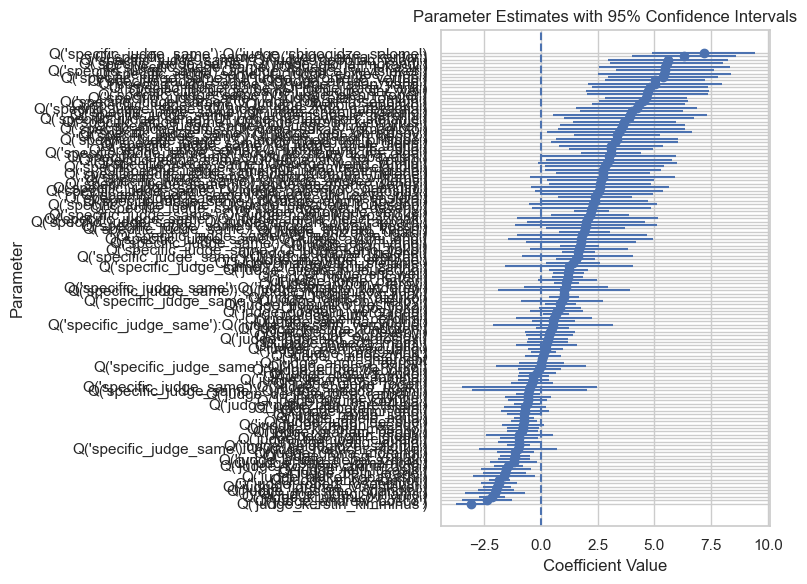

In [153]:
import matplotlib.pyplot as plt

# Sort for cleaner visualization (optional)
param_df = param_df.sort_values("param_val")

fig, ax = plt.subplots(figsize=(8, 6))

# Plot point estimates
ax.scatter(param_df["param_val"], param_df["param_name"])

# Plot confidence intervals
ax.hlines(
    y=param_df["param_name"],
    xmin=param_df["ci_lower"],
    xmax=param_df["ci_upper"]
)

# Vertical line at 0 (helps interpretation)
ax.axvline(0, linestyle="--")

ax.set_xlabel("Coefficient Value")
ax.set_ylabel("Parameter")
ax.set_title("Parameter Estimates with 95% Confidence Intervals")

plt.tight_layout()
plt.show()


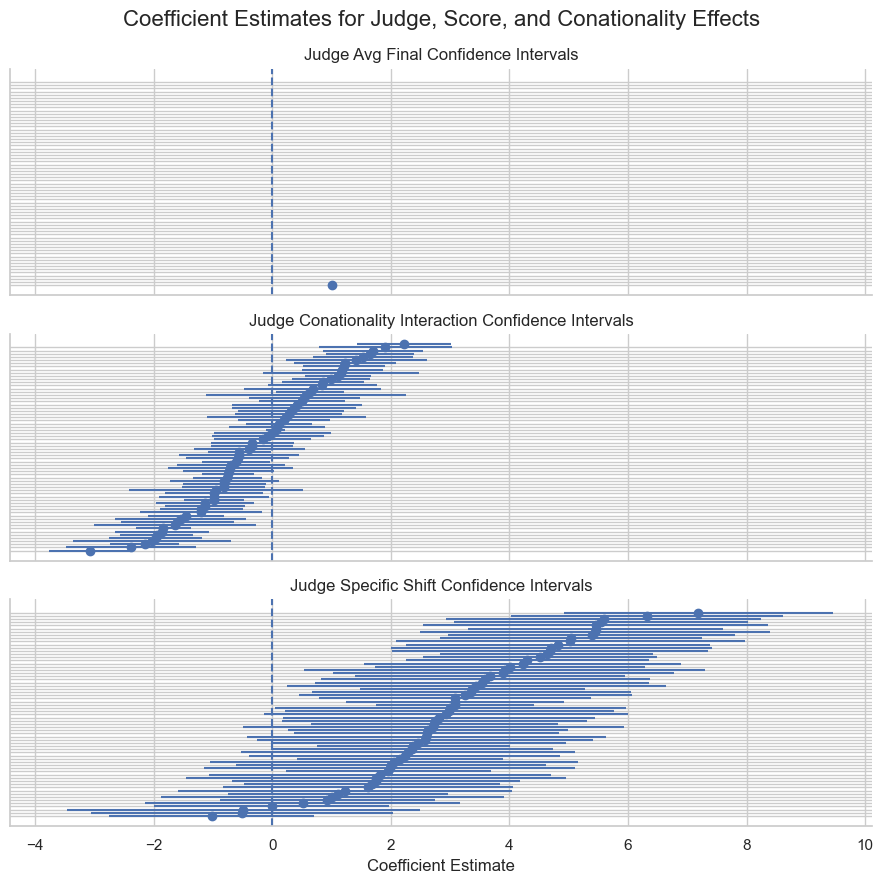

In [154]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = param_df.copy()

# Clean parameter names
df["param_name"] = (
    df["param_name"]
    .str.replace("Q\\('", "", regex=True)
    .str.replace("'\\)", "", regex=True)
)

# Create grouping column
def classify_param(p):
    if "judge_avg_final" in p:
        return "Judge Avg Final"
    elif not "specific_judge_same" in p:
        return "Judge Conationality Interaction"
    else:
        return "Judge Specific Shift"

df["group"] = df["param_name"].apply(classify_param)

# Sort inside groups
df = df.sort_values(["group", "param_val"]).reset_index(drop=True)
df["y"] = df.groupby("group").cumcount()

sns.set_theme(style="whitegrid")

g = sns.FacetGrid(
    df,
    row="group",
    sharex=True,
    height=3,
    aspect=3
)

def forest(data, **kwargs):
    plt.scatter(data["param_val"], data["y"])
    plt.hlines(
        y=data["y"],
        xmin=data["ci_lower"],
        xmax=data["ci_upper"]
    )
    plt.axvline(0, linestyle="--")

g.map_dataframe(forest)

# Label y axis with parameter names
for ax, (group_name, sub) in zip(g.axes.flatten(), df.groupby("group")):
    ax.set_yticks(sub["y"])
    ax.set_title(f"{group_name} Confidence Intervals")
    if group_name == "Judge Avg Final":
        ax.set_yticklabels(sub["param_name"])  # keep label
    else:
        ax.set_yticklabels([])  # remove crowded judge names

plt.suptitle("Coefficient Estimates for Judge, Score, and Conationality Effects", fontsize=16)

g.set_xlabels("Coefficient Estimate")

plt.tight_layout()
plt.show()



## Dist of Dummies

In [103]:
# Filter to only 'specific_judge_same' interaction parameters
dummies_params = param_df[param_df.param_name.isin(quoted_dummies)]

fig = px.histogram(
    dummies_params,
    x="param_val",
    nbins=25,
    title="Histogram of Judge Dummy Parameters",
    labels={"param_val": "Parameter Value"}
)

fig.update_layout(
    xaxis_title="Parameter Value",
    yaxis_title="Count",
    bargap=0.2
)

fig.show()

In [104]:
regression_df[target].describe()

count   41994.0000
mean      100.2009
std        40.3881
min        14.5725
25%        68.4481
50%        89.6712
75%       130.6881
max       248.2300
Name: specific_judge_score, dtype: float64

In [105]:
dummies_params.sort_values(by="param_val")

,param_name,param_val,t_value,p_value
21,Q('judge_kerstin_kimminus'),-3.0733,-11.4881,0.0000
57,Q('judge_andrew_bosco'),-2.3835,-5.5869,0.0000
12,Q('judge_kliushnikov_yury'),-2.1527,-9.5395,0.0000
63,Q('judge_doug_williams'),-2.0271,-3.9331,0.0001
32,Q('judge_massimo_orlandini'),-1.9688,-6.4249,0.0000
13,Q('judge_florence_vuylsteker'),-1.9514,-8.1982,0.0000
27,Q('judge_robert_rosenbluth'),-1.8655,-6.0477,0.0000
3,Q('judge_anna_kantor'),-1.8365,-10.2347,0.0000
64,Q('judge_akiko_kobayashi'),-1.6419,-3.0822,0.0021
47,Q('judge_beth_crane'),-1.6048,-4.3401,0.0000


## Dist of Interactions 

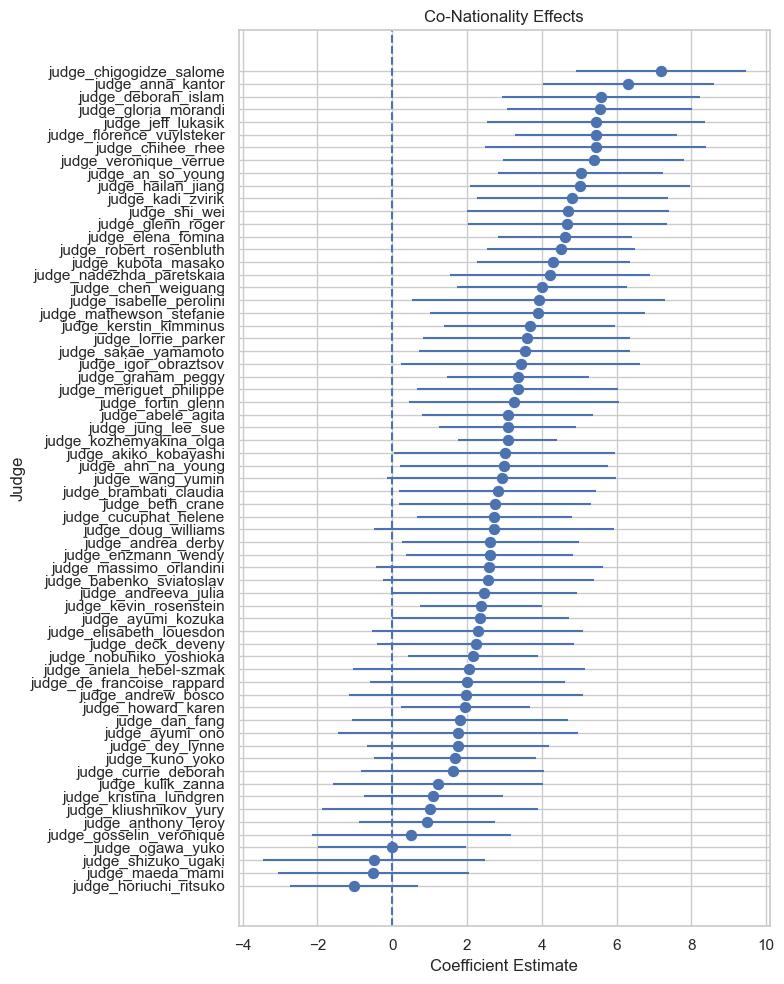

In [161]:
df = param_df.copy()

# Keep only interaction terms
df = df[df["param_name"].str.contains(":")]
df = df.sort_values("param_val", key=lambda x: x.abs())

# Extract judge name from interaction
df["judge_name"] = (
    df["param_name"]
    .str.extract(r"Q\('specific_judge_same'\):Q\('([^']+)'\)")
)

# Sort by coefficient (or absolute effect)
df = df.sort_values("param_val").reset_index(drop=True)
df["y"] = df.index

sns.set_theme(style="whitegrid")

plt.figure(figsize=(8, 10))

# Plot points
sns.scatterplot(data=df, x="param_val", y="y", s=80)

# Plot confidence intervals
plt.hlines(
    y=df["y"],
    xmin=df["ci_lower"],
    xmax=df["ci_upper"]
)

# Reference line
plt.axvline(0, linestyle="--")

# Use judge names as labels
plt.yticks(df["y"], df["judge_name"])

plt.xlabel("Coefficient Estimate")
plt.ylabel("Judge")
plt.title("Co-Nationality Effects")

plt.tight_layout()
plt.show()


In [156]:
# Filter to only 'specific_judge_same' interaction parameters
same_judge_params = param_df[param_df.param_name.isin(interaction_terms)]

fig = px.histogram(
    same_judge_params,
    x="param_val",
    nbins=25,
    title="Histogram of Co-Nationality Indicator Parameters",
    labels={"param_val": "Estimated Parameter Value"}
)

fig.update_layout(
    xaxis_title="Parameter Value",
    yaxis_title="Count",
    bargap=0.2
)

fig.show()

In [107]:
same_judge_params.sort_values(by="param_val")

,param_name,param_val,t_value,p_value
79,Q('specific_judge_same'):Q('judge_horiuchi_rit...,-1.0239,-1.5303,0.1259
106,Q('specific_judge_same'):Q('judge_maeda_mami'),-0.5097,-0.5145,0.6069
123,Q('specific_judge_same'):Q('judge_shizuko_ugaki'),-0.4880,-0.4221,0.6730
96,Q('specific_judge_same'):Q('judge_ogawa_yuko'),-0.0109,-0.0142,0.9887
124,Q('specific_judge_same'):Q('judge_gosselin_ver...,0.5134,0.4984,0.6182
71,Q('specific_judge_same'):Q('judge_anthony_leroy'),0.9254,1.3160,0.1882
77,Q('specific_judge_same'):Q('judge_kliushnikov_...,1.0139,0.9015,0.3673
88,Q('specific_judge_same'):Q('judge_kristina_lun...,1.1029,1.5328,0.1253
75,Q('specific_judge_same'):Q('judge_kulik_zanna'),1.2285,1.1235,0.2612
110,Q('specific_judge_same'):Q('judge_currie_debor...,1.6136,1.7018,0.0888


In [150]:
same_judge_params[lambda x: np.abs(x.p_value) < 0.05].shape

(50, 4)

## Checking Model Assumptions

In [88]:
y_hat = model.predict(regression_df)
residuals = regression_df[target] - y_hat
regression_df["y_hat"] = y_hat
regression_df["residuals"] = residuals
print(f"Train MSE: {np.mean(residuals ** 2) }")

Train MSE: 20.588229223913196


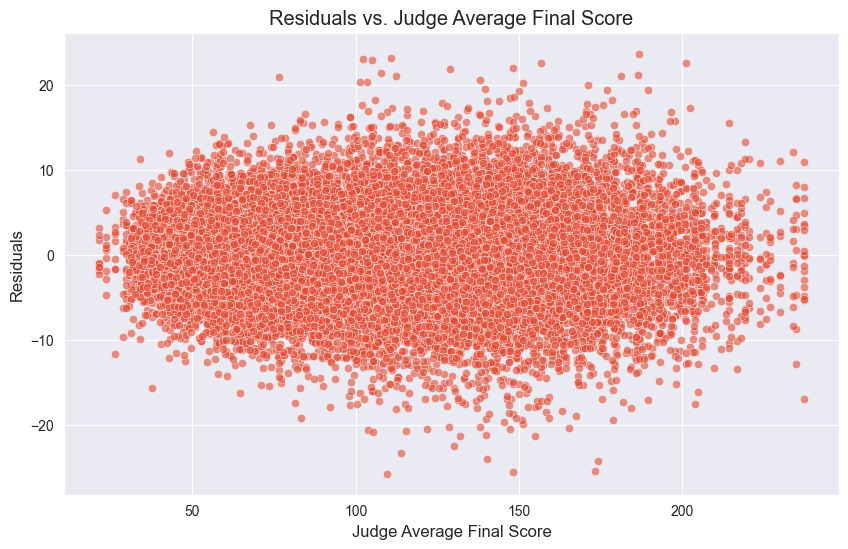

In [131]:
# predictor vs residuals
# testing: E[e | X] = 0 => expect dots to be centered around 0
# testing: Var(e | X) = sigma^2 => expect dots to be roughly same clustering from 0
plt.figure(figsize=(10, 6))  # make figure wider
sns.scatterplot(data=regression_df, x="judge_avg_final", y="residuals", alpha=0.6)
plt.xlabel("Judge Average Final Score")
plt.ylabel("Residuals")
plt.title("Residuals vs. Judge Average Final Score")
plt.show()

Text(0.5, 1.0, 'Distribution of Residuals')

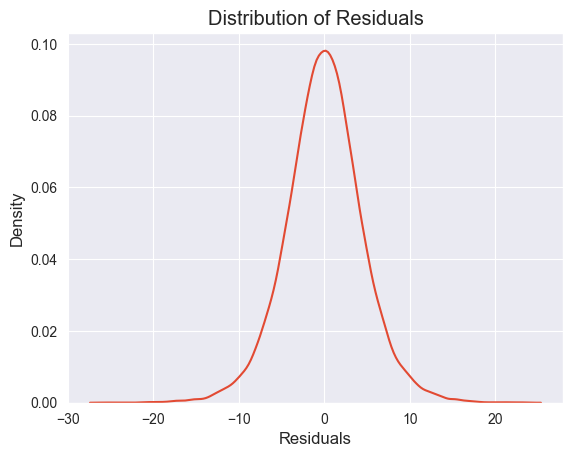

In [133]:
# distribution of residuals
sns.kdeplot(data=regression_df, x="residuals")
plt.xlabel("Residuals")
plt.title("Distribution of Residuals")

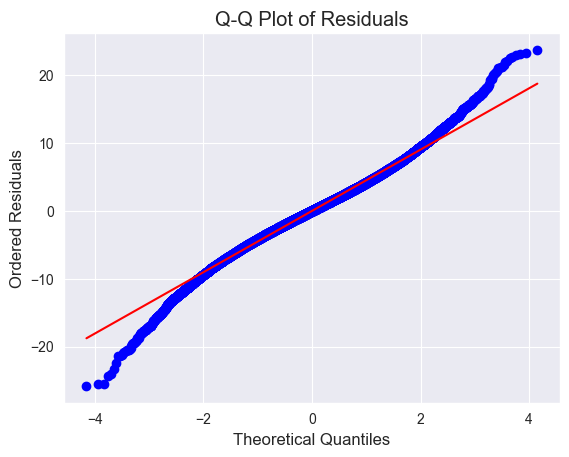

In [134]:
stats.probplot(regression_df["residuals"], dist='norm', plot=plt)
plt.title("Q-Q Plot of Residuals")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Ordered Residuals")
plt.show()

In [92]:
# residuals independent of sample?
fig = px.scatter(
    regression_df,
    x="judge_avg_final",
    y="residuals",
    color="competition",
    opacity=0.6,
)

fig.show()

In [135]:
fig = px.scatter(
    regression_df,
    x="judge_avg_final",
    y="residuals",
    color="isu_year",
    opacity=0.6,
    title="Residuals vs. Judge Average Final Score by ISU Year",
    labels={
        "judge_avg_final": "Judge Average Final Score",
        "residuals": "Residuals",
        "isu_year": "ISU Year",
    },
)

fig.show()

In [94]:
regression_df

,specific_judge_score,specific_judge_name,specific_judge_nat,specific_judge_same,judge_avg_final,skater_name,skater_nat,isu_year,competition,is_short_program,category,event_type,judge_abele_agita,judge_anna_kantor,judge_chigogidze_salome,judge_de_francoise_rappard,judge_anthony_leroy,judge_kadi_zvirik,judge_jung_lee_sue,judge_nadezhda_paretskaia,judge_kulik_zanna,judge_kozhemyakina_olga,judge_kliushnikov_yury,judge_florence_vuylsteker,judge_horiuchi_ritsuko,judge_kevin_rosenstein,judge_howard_karen,judge_nobuhiko_yoshioka,judge_an_so_young,judge_elena_fomina,judge_graham_peggy,judge_kerstin_kimminus,judge_kubota_masako,judge_kristina_lundgren,judge_shi_wei,judge_aniela_hebel-szmak,judge_cucuphat_helene,judge_robert_rosenbluth,judge_chen_weiguang,judge_hailan_jiang,judge_veronique_verrue,judge_ogawa_yuko,judge_massimo_orlandini,judge_chihee_rhee,judge_gloria_morandi,judge_brambati_claudia,judge_meriguet_philippe,judge_ayumi_kozuka,judge_dan_fang,judge_elisabeth_louesdon,judge_kuno_yoko,judge_maeda_mami,judge_enzmann_wendy,judge_babenko_sviatoslav,judge_deborah_islam,judge_currie_deborah,judge_glenn_roger,judge_beth_crane,judge_wang_yumin,judge_ahn_na_young,judge_andrea_derby,judge_dey_lynne,judge_sakae_yamamoto,judge_igor_obraztsov,judge_deck_deveny,judge_ayumi_ono,judge_jeff_lukasik,judge_andrew_bosco,judge_shizuko_ugaki,judge_gosselin_veronique,judge_mathewson_stefanie,judge_andreeva_julia,judge_lorrie_parker,judge_doug_williams,judge_akiko_kobayashi,judge_fortin_glenn,judge_isabelle_perolini,y_hat,residuals
0,129.5000,guskov_yuri,KAZ,1,114.4444,Abzal Rakimgaliev,KAZ,1718,fc2018,0,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,114.4609,15.0391
1,55.4900,keen_leslie,CAN,0,60.1011,Abzal Rakimgaliev,KAZ,1718,fc2018,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60.1388,-4.6488
2,57.8800,anna_sierocka,POL,0,61.6578,Abzal Rakimgaliev,KAZ,1718,wc2018,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,61.6948,-3.8148
3,67.0800,popova_vessela,BUL,0,66.4133,Adam Hagara,SVK,2122,ec2022,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,66.4485,0.6315
4,68.0100,guskov_yuriy,KAZ,0,60.9267,Adam Hagara,SVK,2122,wc2022,1,men,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,60.9640,7.0460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4661,52.4000,ehalt_saara,FIN,0,47.5333,Zoe Jones / Christopher Boyadji,GBR,2122,gpcan2021,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,47.5759,4.8241
4662,98.5000,gloria_morandi,ITA,0,94.0778,Zoe Jones / Christopher Boyadji,GBR,2122,wc2022,0,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,92.9672,5.5328
4663,54.0000,smidova_stanislava,CZE,0,50.3556,Zoe Jones / Christopher Boyadji,GBR,2122,wc2022,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,50.3970,3.6030
4664,59.9000,buttarelli_marco,ITA,0,55.7444,Zukova Jelizaveta / Bidar Martin,CZE,2122,owg2022,1,pairs,individual,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

In [136]:
# residuals independent of sample?
fig = px.scatter(
    regression_df.assign(is_short_program = lambda x: np.where(x.is_short_program == 1, "short", "free")),
    x="judge_avg_final",
    y="residuals",
    color="is_short_program",
    opacity=0.6,
    title="Residuals vs. Judge Average Final Score by Short/Free",
    labels={
        "judge_avg_final": "Judge Average Final Score",
        "residuals": "Residuals",
        "is_short_program": "Program Type",
    },
)

fig.show()